# HECATE-DS

HarvEsting loCAl specTra with Exoplanets (Doppler Shadow)

I will run the modular components of the tool, including two main modules:

1. Extraction
2. Analysis

I will also add a class just for plots, a class to compute CCFs and a class to run SOAP.

this way, when the user wants to extract the local spectra, the code will fetch the auxiliar functions, but at the same time the user can run the CCFs and SOAP separately.

In [1]:
import numpy as np
from HECATE import HECATE
from build_CCF import build_CCF
from run_SOAP import run_SOAP

from get_data import *
from plots import *

In [2]:
stellar_params = {
                "Teff":4969, "Teff_err":43,   #effective temperature [K]
                "logg":4.60, "logg_err":0.01, #superficial gravity [dex]
                "FeH":-0.07, "FeH_err":0.02,  #metallicity [dex]
                "P_rot":2.21857312,           #rotation period [d]
                "R_star":0.766,               #radius [solar radii]
                "inc_star":71.87              #stellar inclination [º]
                }

planet_params = {
                "P_orb":2.21857312,           #orbital period [d]
                "a_R":8.76863,                #system scale [stellar radii]
                "Rp_Rs":0.1602,               #planet-to-star radius ratio 
                "t0":53988.30339,             #mid-transit time [d]
                "e":0,                        #orbital eccentricity
                "w":90,                       #argument of periastron [º]
                "inc_planet":85.465,          #planet inclination [º]
                "lbda":-1.00,                 #spin-orbit angle [º]
                "dfp": -0.002424              #mid-transit phase shift
                }

# White light CCF

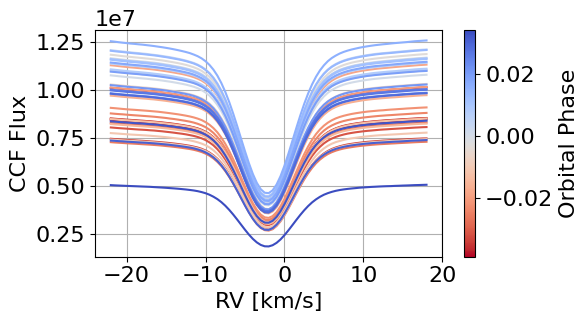

In [3]:
CCFs, time, airmass, berv, bervmax, snr, list_ccfs = get_CCFs(planet_params, day='2021-08-11')

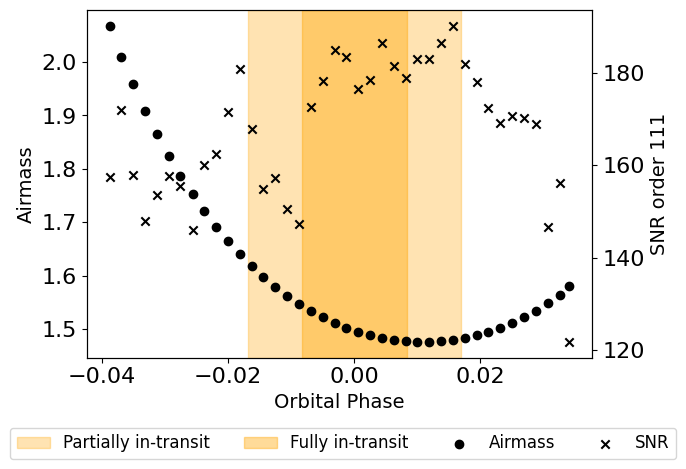

In [4]:
plot_air_snr(planet_params, time, airmass, snr)

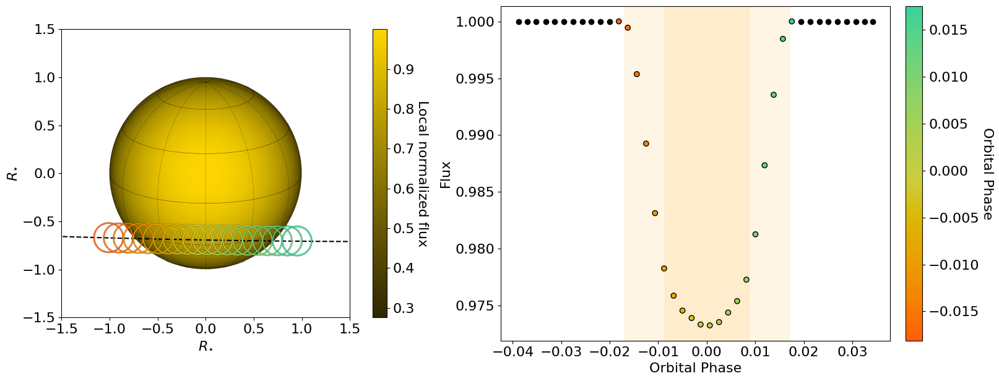

In [5]:
Flux_SOAP = run_SOAP(time, stellar_params, planet_params, plot=True).flux

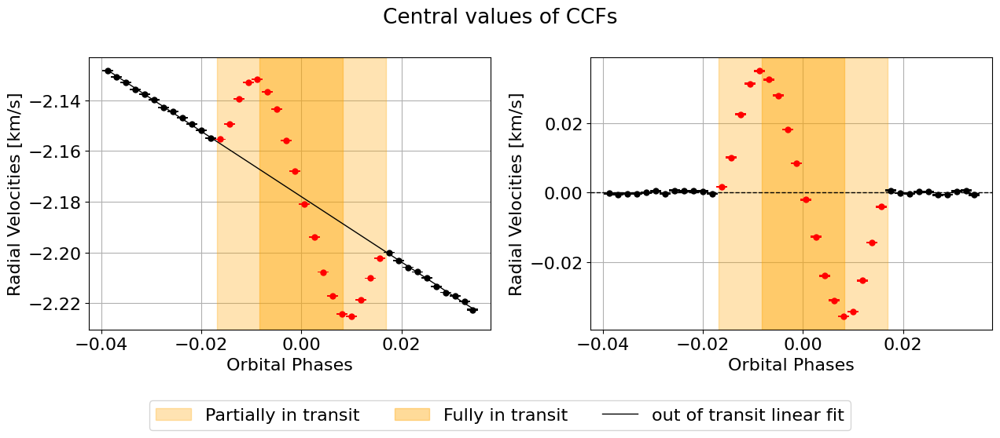

In [5]:
hecate = HECATE(planet_params, stellar_params, time, CCFs)

CCFs_sysvel_corr, _ = hecate.sysvel_correction(CCFs, model="modified Gaussian", print_output=False, plot_fits=False, plot_sys_vel=True)

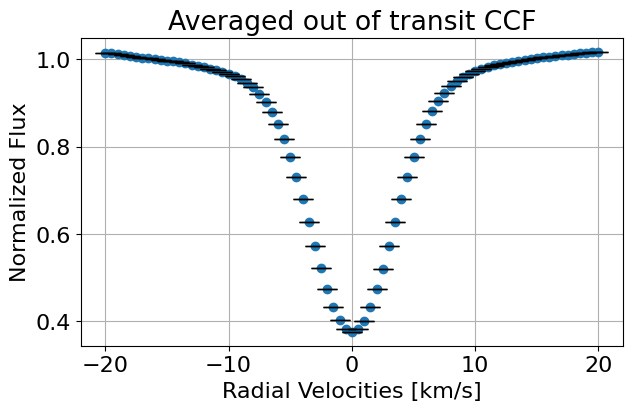

In [6]:
hecate = HECATE(planet_params, stellar_params, time, CCFs_sysvel_corr)

RV_reference = np.arange(round(np.max(CCFs_sysvel_corr[:,2,0])), round(np.min(CCFs_sysvel_corr[:,2,-1]))+0.5, 0.5)

CCF_interp, avg_out_of_transit_CCF = hecate.avg_out_of_transit_CCF(CCFs_sysvel_corr, RV_reference, plot=True, save=None)

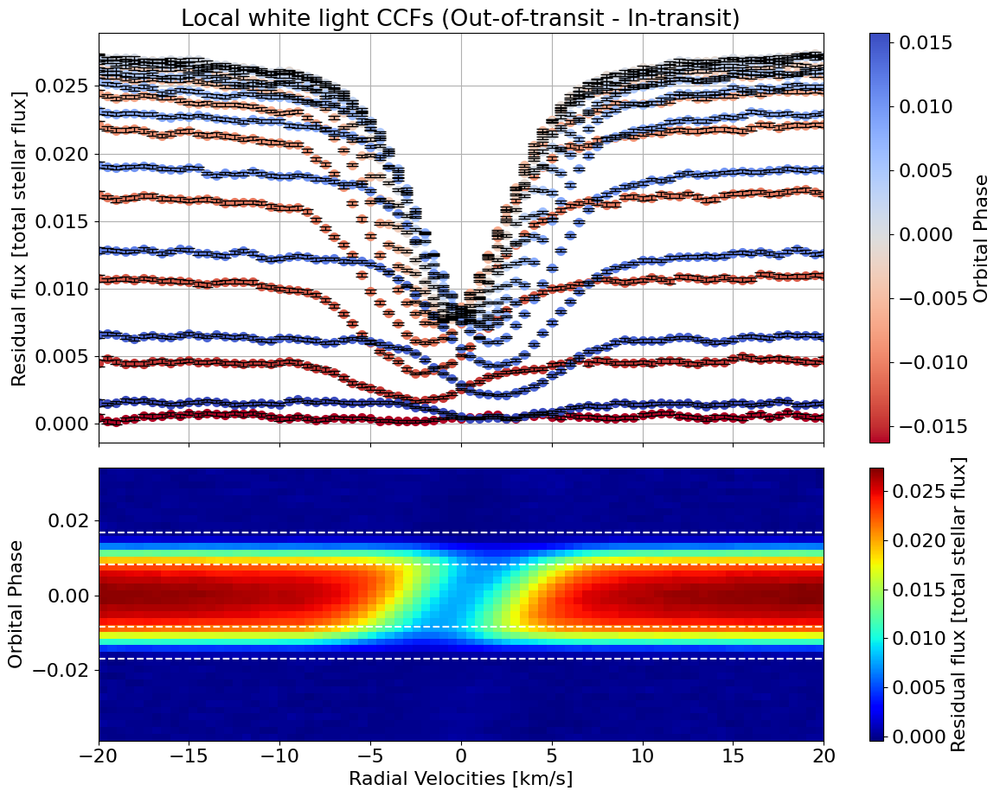

In [7]:
hecate = HECATE(planet_params, stellar_params, time, CCFs)

plot = {"SOAP":False, "fits_initial_CCF":False, "sys_vel":False, "avg_out_of_transit_CCF":False, "local_CCFs":True}

ccf_type = "white light"
model_fit = "modified Gaussian"

local_CCFs, CCFs_flux_corr, CCFs_sub_all = hecate.extract_local_CCF(model_fit, ccf_type, plot, save=None)

##############################
Fitting modified Gaussian model to master CCF
------------------------------
Fit parameters:
y0 = 0.999703 ± 0.000005
x0 = -0.000405 ± 0.000049
sigma = 3.404389 ± 0.000090
a = 0.629543 ± 0.000011
c = 1.823682 ± 0.000085
R^2:  0.9983
------------------------------
CCF parameters:
Central RV [km/s]: -0.000405 ± 0.000049
Continuum: 0.999703 ± 0.000005
Deph [%]: 37.027000 ± 0.001098
Width [km/s]: 3.404389 ± 0.000090


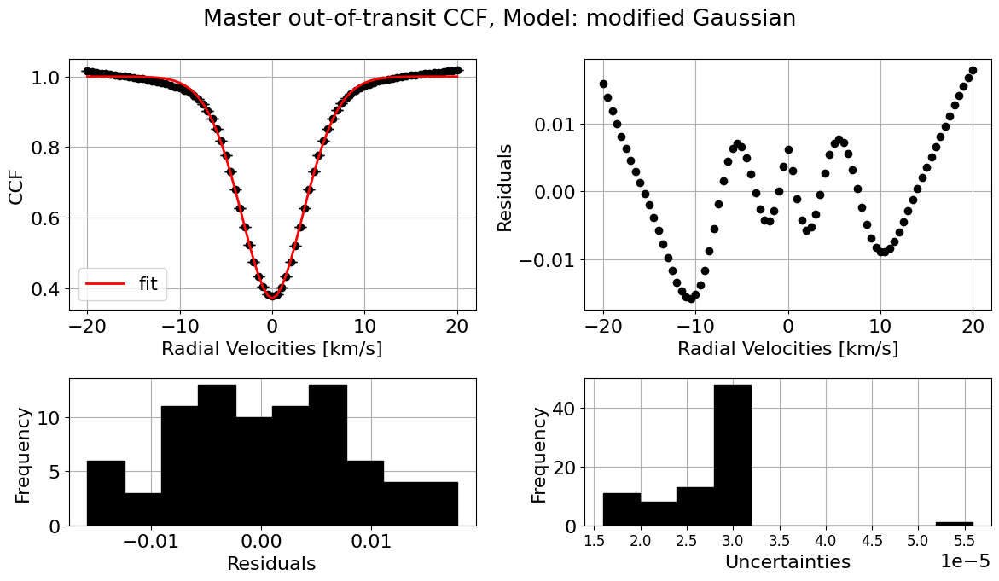

In [8]:
master_central_rv_array, master_continuum_array, master_depth_array, master_width_array, master_R2_array = hecate.CCF_parameters(CCFs=avg_out_of_transit_CCF, ccf_type="master", model="modified Gaussian", print_output=True, plot_fit=True, save=None)

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.016
------------------------------
Fit parameters:
y0 = 0.000540 ± 0.000019
x0 = -3.251063 ± 0.297659
sigma = 1.841974 ± 0.659533
a = 0.000389 ± 0.000078
c = 1.492638 ± 0.647827
R^2:  0.3436
------------------------------
CCF parameters:
Central RV [km/s]: -3.251063 ± 0.297659
Continuum: 0.000540 ± 0.000019
Deph [%]: 28.019500 ± 14.720651
Width [km/s]: 1.841974 ± 0.659533


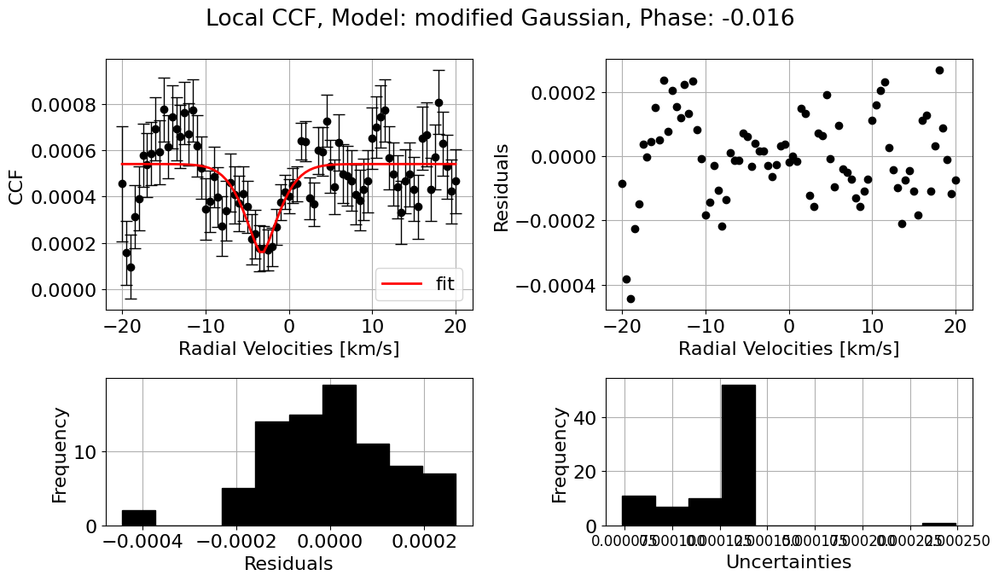

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.014
------------------------------
Fit parameters:
y0 = 0.004602 ± 0.000023
x0 = -2.359127 ± 0.049235
sigma = 2.906079 ± 0.094416
a = 0.002925 ± 0.000060
c = 1.788624 ± 0.094567
R^2:  0.9811
------------------------------
CCF parameters:
Central RV [km/s]: -2.359127 ± 0.049235
Continuum: 0.004602 ± 0.000023
Deph [%]: 36.450129 ± 1.343548
Width [km/s]: 2.906079 ± 0.094416


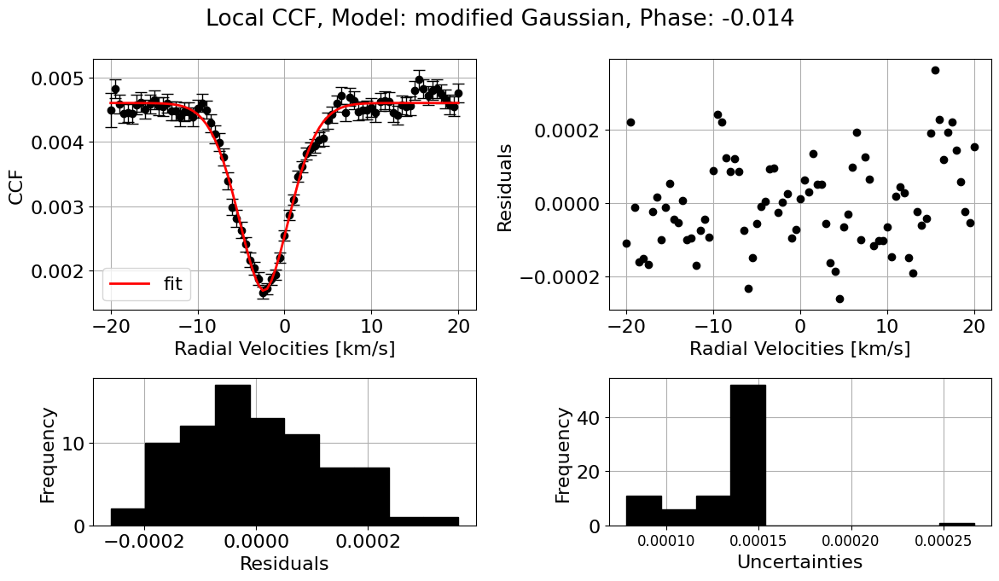

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.012
------------------------------
Fit parameters:
y0 = 0.010664 ± 0.000022
x0 = -2.106883 ± 0.020402
sigma = 3.136610 ± 0.037117
a = 0.006951 ± 0.000054
c = 1.924421 ± 0.040747
R^2:  0.9942
------------------------------
CCF parameters:
Central RV [km/s]: -2.106883 ± 0.020402
Continuum: 0.010664 ± 0.000022
Deph [%]: 34.814794 ± 0.523484
Width [km/s]: 3.136610 ± 0.037117


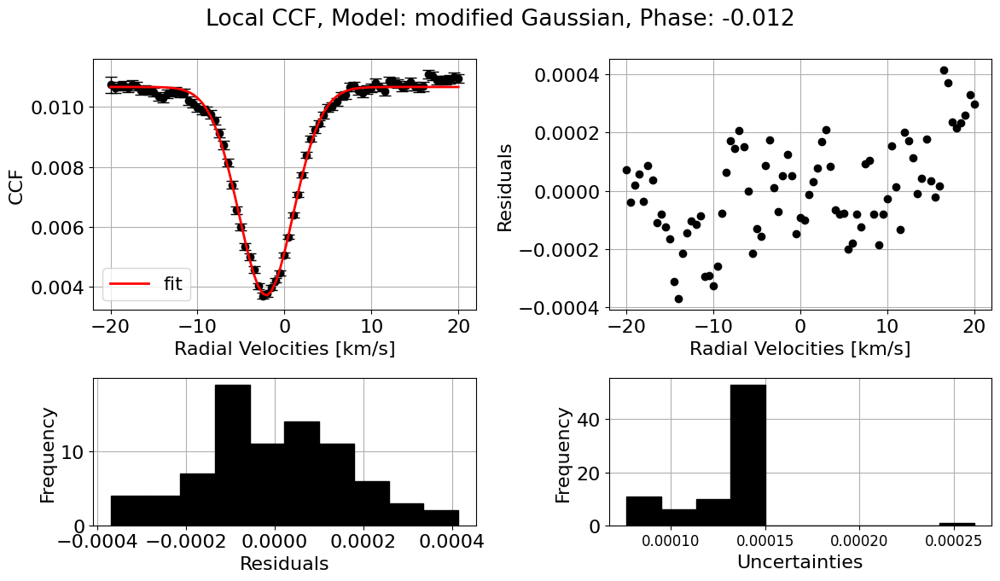

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.010
------------------------------
Fit parameters:
y0 = 0.016758 ± 0.000023
x0 = -1.817014 ± 0.013411
sigma = 3.203827 ± 0.024026
a = 0.010855 ± 0.000054
c = 1.978141 ± 0.027566
R^2:  0.9959
------------------------------
CCF parameters:
Central RV [km/s]: -1.817014 ± 0.013411
Continuum: 0.016758 ± 0.000023
Deph [%]: 35.227354 ± 0.332968
Width [km/s]: 3.203827 ± 0.024026


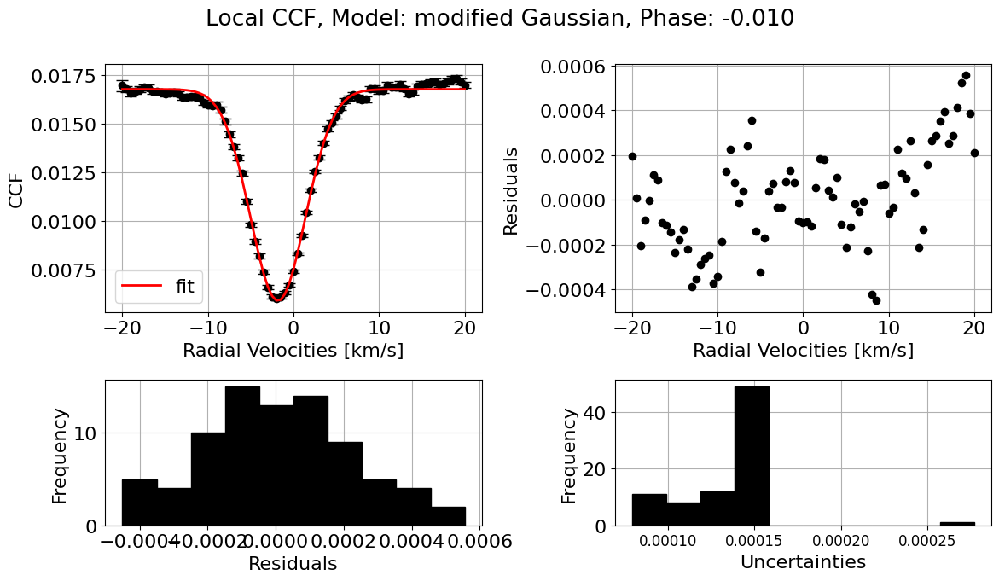

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.008
------------------------------
Fit parameters:
y0 = 0.021613 ± 0.000023
x0 = -1.469715 ± 0.010236
sigma = 3.149738 ± 0.018459
a = 0.014392 ± 0.000055
c = 1.928501 ± 0.020512
R^2:  0.9968
------------------------------
CCF parameters:
Central RV [km/s]: -1.469715 ± 0.010236
Continuum: 0.021613 ± 0.000023
Deph [%]: 33.408259 ± 0.262109
Width [km/s]: 3.149738 ± 0.018459


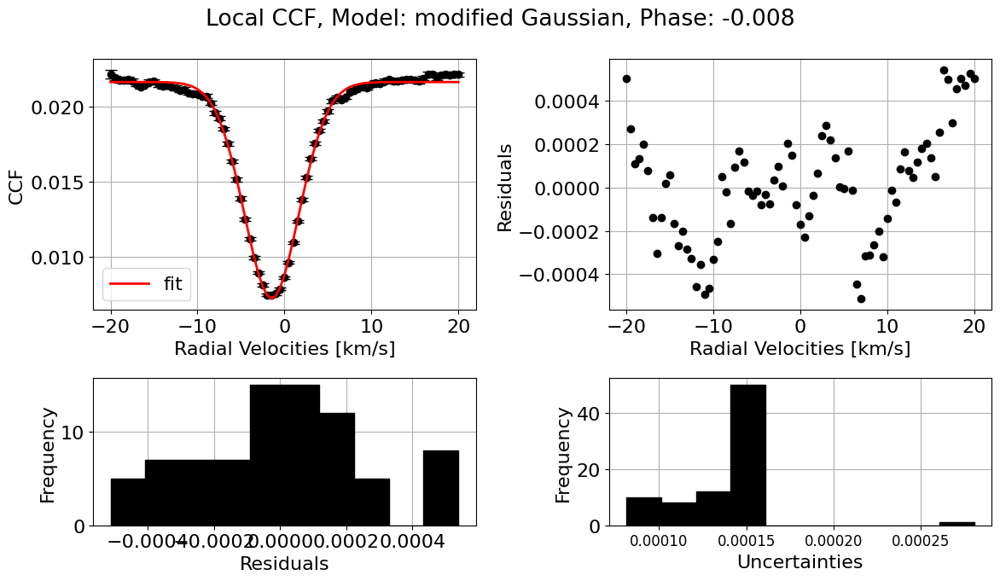

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.006
------------------------------
Fit parameters:
y0 = 0.024037 ± 0.000020
x0 = -1.142839 ± 0.007414
sigma = 3.070131 ± 0.013518
a = 0.016579 ± 0.000046
c = 1.888435 ± 0.014838
R^2:  0.9966
------------------------------
CCF parameters:
Central RV [km/s]: -1.142839 ± 0.007414
Continuum: 0.024037 ± 0.000020
Deph [%]: 31.026404 ± 0.201408
Width [km/s]: 3.070131 ± 0.013518


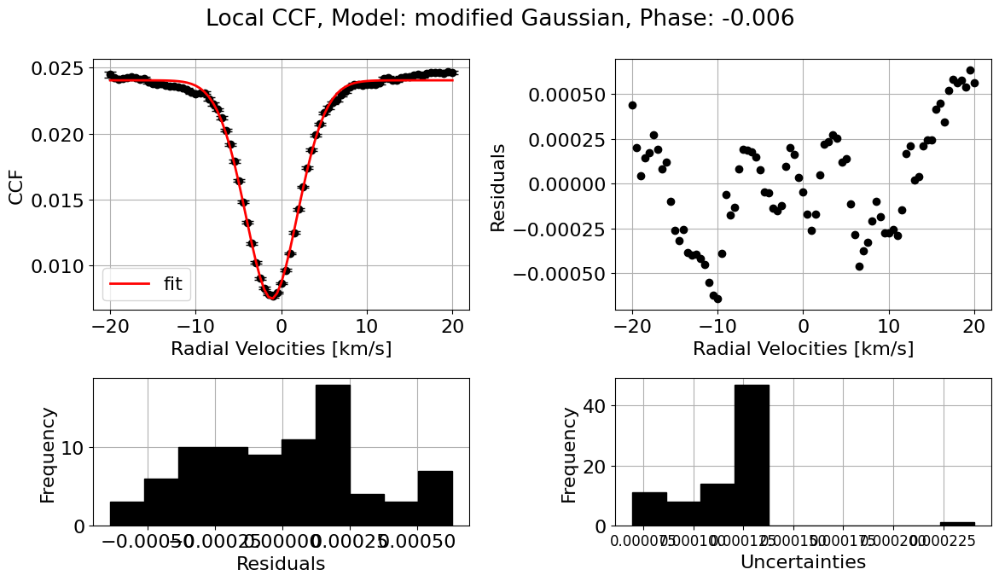

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.005
------------------------------
Fit parameters:
y0 = 0.025374 ± 0.000019
x0 = -0.880873 ± 0.006531
sigma = 3.029822 ± 0.011803
a = 0.017835 ± 0.000044
c = 1.905788 ± 0.013420
R^2:  0.997
------------------------------
CCF parameters:
Central RV [km/s]: -0.880873 ± 0.006531
Continuum: 0.025374 ± 0.000019
Deph [%]: 29.709542 ± 0.181210
Width [km/s]: 3.029822 ± 0.011803


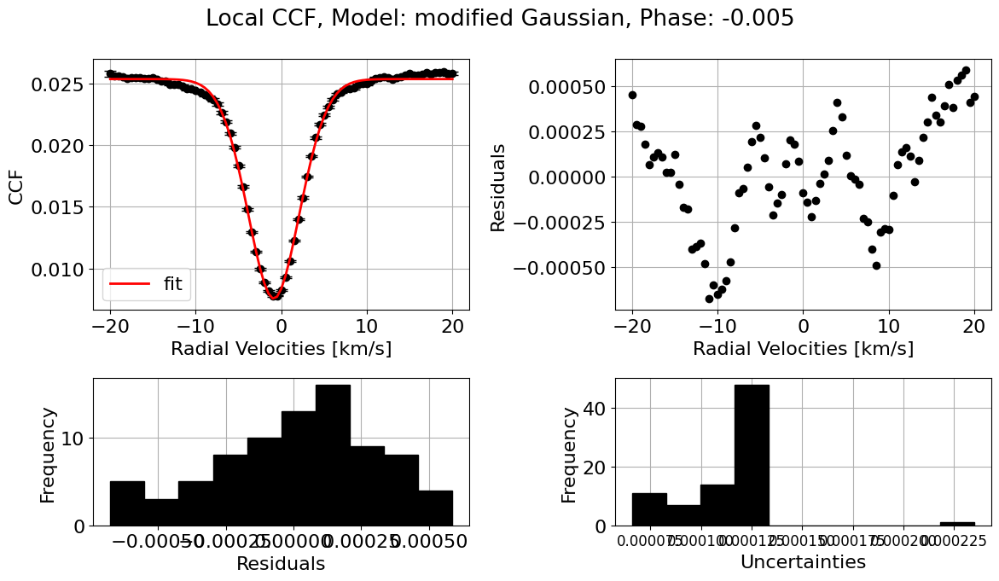

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.003
------------------------------
Fit parameters:
y0 = 0.026044 ± 0.000018
x0 = -0.546187 ± 0.006038
sigma = 3.001790 ± 0.010998
a = 0.018448 ± 0.000042
c = 1.876431 ± 0.012266
R^2:  0.9974
------------------------------
CCF parameters:
Central RV [km/s]: -0.546187 ± 0.006038
Continuum: 0.026044 ± 0.000018
Deph [%]: 29.166068 ± 0.170025
Width [km/s]: 3.001790 ± 0.010998


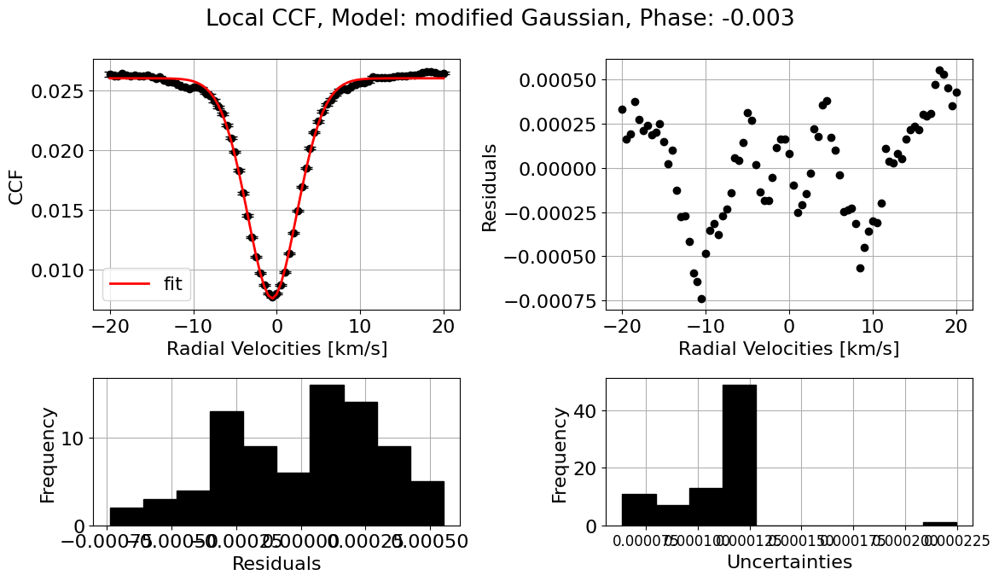

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.001
------------------------------
Fit parameters:
y0 = 0.026651 ± 0.000018
x0 = -0.244274 ± 0.005890
sigma = 3.036914 ± 0.010576
a = 0.018947 ± 0.000042
c = 1.930481 ± 0.012393
R^2:  0.9972
------------------------------
CCF parameters:
Central RV [km/s]: -0.244274 ± 0.005890
Continuum: 0.026651 ± 0.000018
Deph [%]: 28.904982 ± 0.164069
Width [km/s]: 3.036914 ± 0.010576


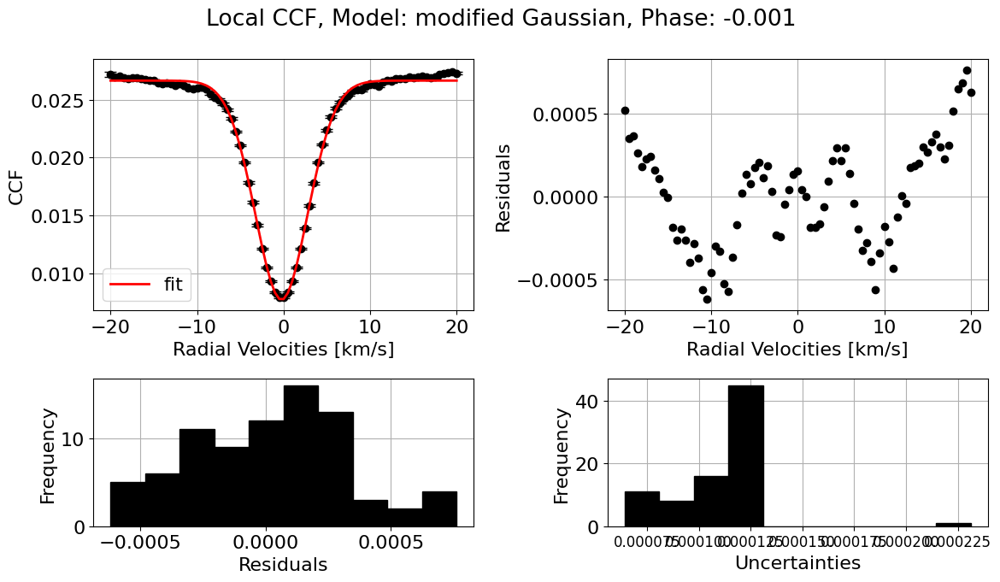

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0006
------------------------------
Fit parameters:
y0 = 0.026732 ± 0.000019
x0 = 0.059340 ± 0.006116
sigma = 3.019227 ± 0.011083
a = 0.019013 ± 0.000044
c = 1.886572 ± 0.012452
R^2:  0.9976
------------------------------
CCF parameters:
Central RV [km/s]: 0.059340 ± 0.006116
Continuum: 0.026732 ± 0.000019
Deph [%]: 28.877203 ± 0.170867
Width [km/s]: 3.019227 ± 0.011083


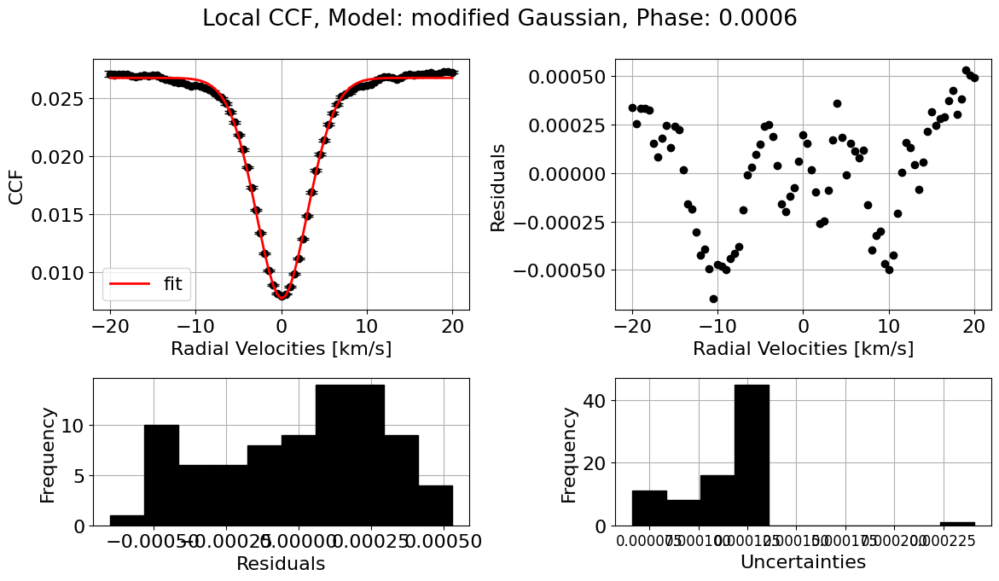

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0025
------------------------------
Fit parameters:
y0 = 0.026409 ± 0.000019
x0 = 0.376700 ± 0.006121
sigma = 3.036588 ± 0.011083
a = 0.018714 ± 0.000043
c = 1.910537 ± 0.012693
R^2:  0.9967
------------------------------
CCF parameters:
Central RV [km/s]: 0.376700 ± 0.006121
Continuum: 0.026409 ± 0.000019
Deph [%]: 29.139143 ± 0.171072
Width [km/s]: 3.036588 ± 0.011083


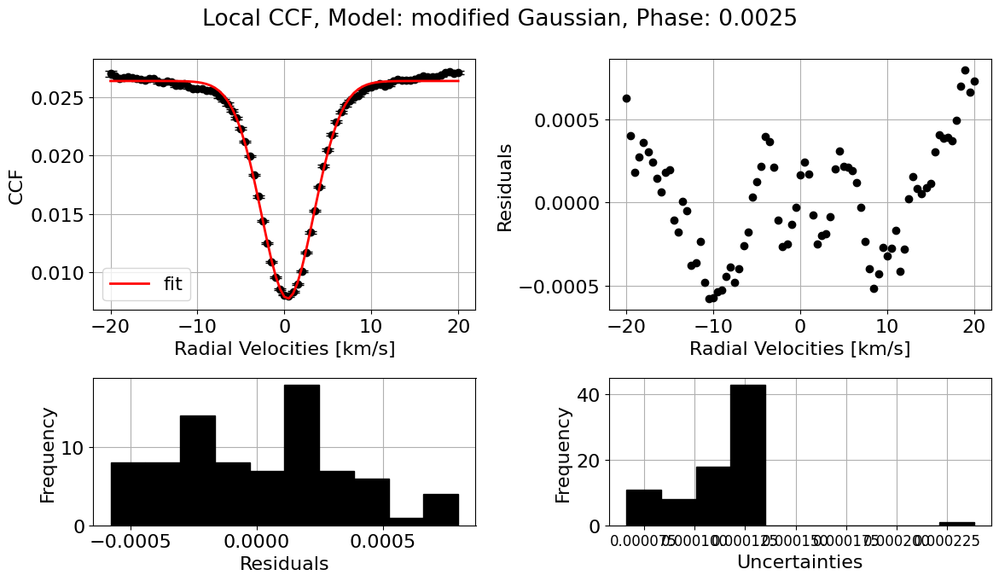

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0044
------------------------------
Fit parameters:
y0 = 0.025567 ± 0.000018
x0 = 0.732851 ± 0.005991
sigma = 2.983976 ± 0.010998
a = 0.018304 ± 0.000042
c = 1.871971 ± 0.012203
R^2:  0.9974
------------------------------
CCF parameters:
Central RV [km/s]: 0.732851 ± 0.005991
Continuum: 0.025567 ± 0.000018
Deph [%]: 28.406018 ± 0.173013
Width [km/s]: 2.983976 ± 0.010998


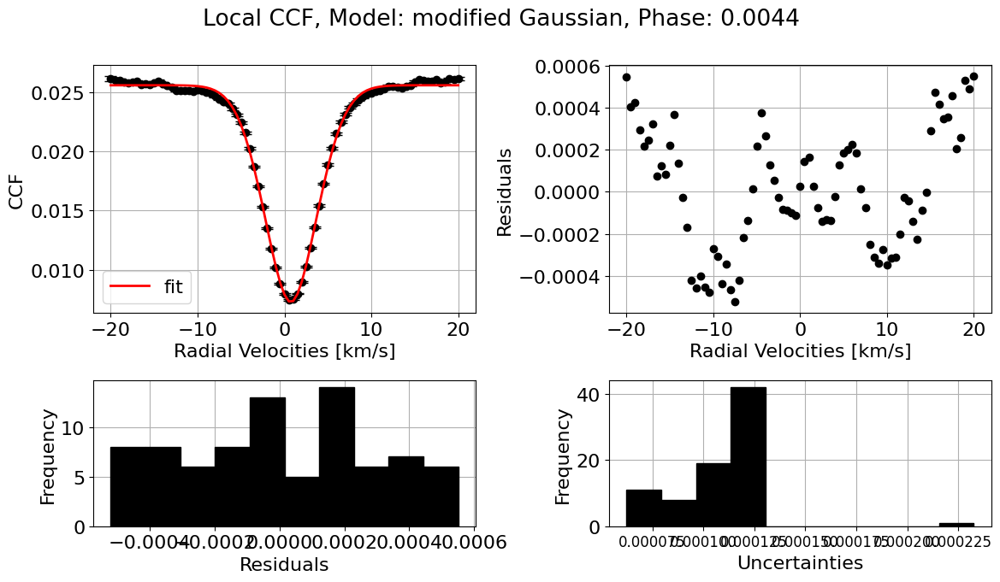

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0062
------------------------------
Fit parameters:
y0 = 0.024538 ± 0.000018
x0 = 1.034318 ± 0.006647
sigma = 3.018821 ± 0.012100
a = 0.017217 ± 0.000044
c = 1.880090 ± 0.013379
R^2:  0.9971
------------------------------
CCF parameters:
Central RV [km/s]: 1.034318 ± 0.006647
Continuum: 0.024538 ± 0.000018
Deph [%]: 29.836300 ± 0.185343
Width [km/s]: 3.018821 ± 0.012100


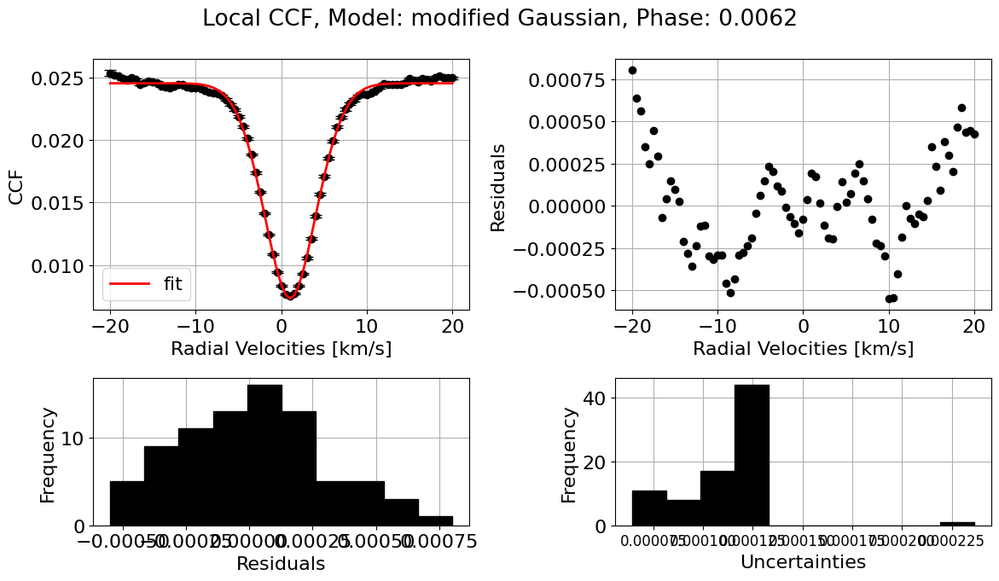

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0081
------------------------------
Fit parameters:
y0 = 0.022604 ± 0.000019
x0 = 1.341292 ± 0.007413
sigma = 3.027491 ± 0.013516
a = 0.015680 ± 0.000045
c = 1.895636 ± 0.015101
R^2:  0.997
------------------------------
CCF parameters:
Central RV [km/s]: 1.341292 ± 0.007413
Continuum: 0.022604 ± 0.000019
Deph [%]: 30.630484 ± 0.205804
Width [km/s]: 3.027491 ± 0.013516


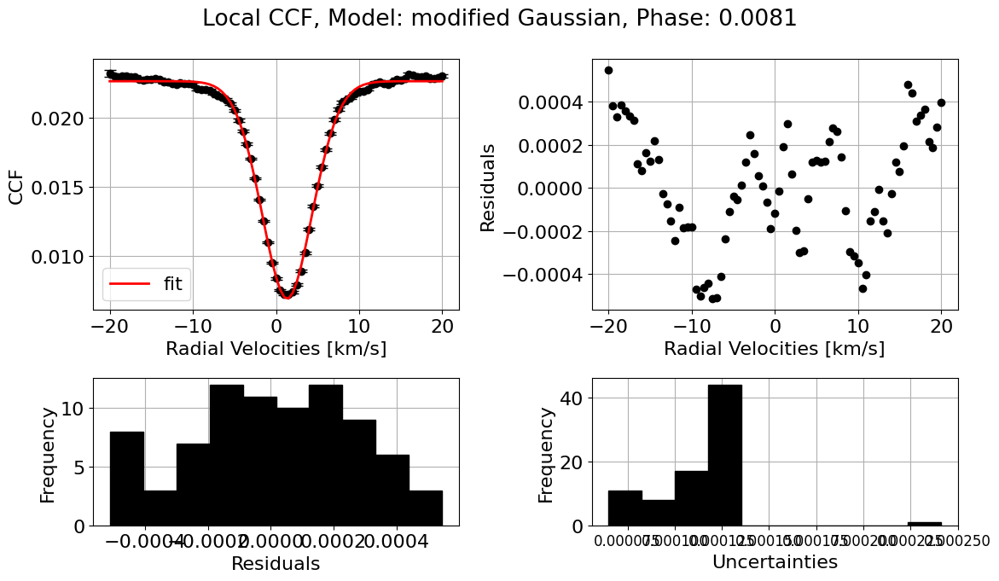

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0100
------------------------------
Fit parameters:
y0 = 0.018618 ± 0.000018
x0 = 1.645707 ± 0.009034
sigma = 3.040807 ± 0.016542
a = 0.012733 ± 0.000045
c = 1.888801 ± 0.018158
R^2:  0.9968
------------------------------
CCF parameters:
Central RV [km/s]: 1.645707 ± 0.009034
Continuum: 0.018618 ± 0.000018
Deph [%]: 31.608864 ± 0.248726
Width [km/s]: 3.040807 ± 0.016542


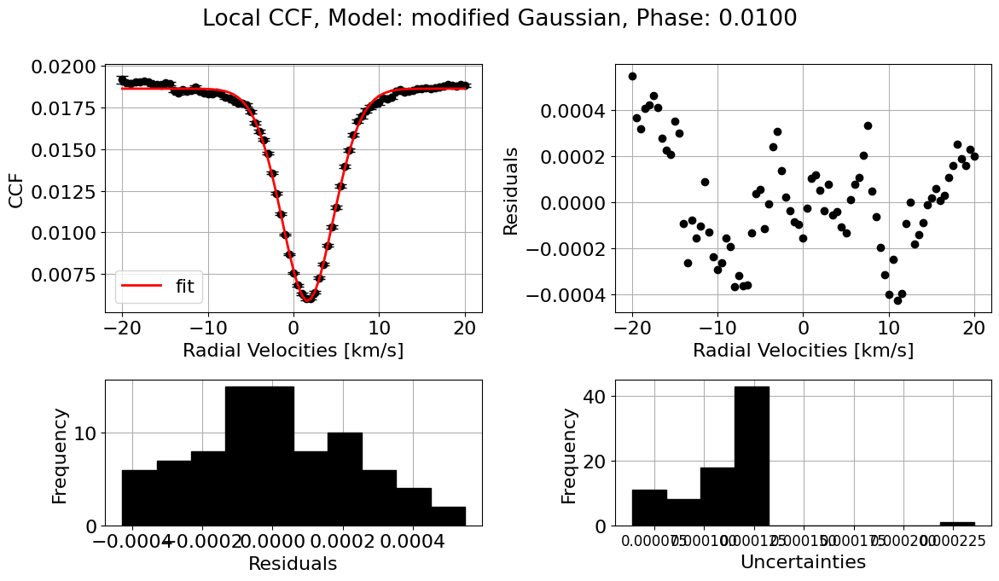

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0119
------------------------------
Fit parameters:
y0 = 0.012545 ± 0.000018
x0 = 1.908697 ± 0.013953
sigma = 3.100034 ± 0.025204
a = 0.008359 ± 0.000045
c = 1.950598 ± 0.028799
R^2:  0.9956
------------------------------
CCF parameters:
Central RV [km/s]: 1.908697 ± 0.013953
Continuum: 0.012545 ± 0.000018
Deph [%]: 33.371194 ± 0.368715
Width [km/s]: 3.100034 ± 0.025204


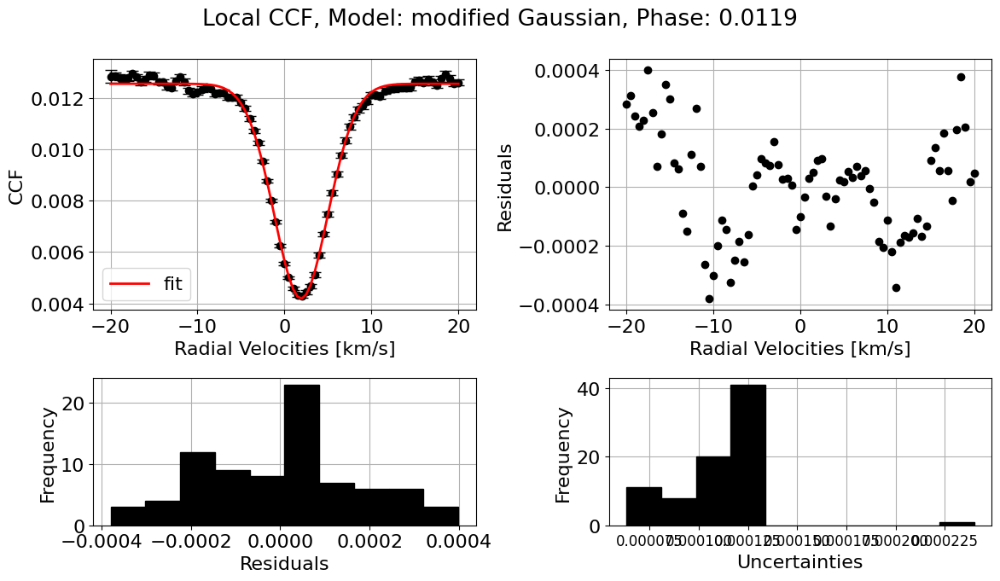

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0137
------------------------------
Fit parameters:
y0 = 0.006346 ± 0.000017
x0 = 2.099462 ± 0.025687
sigma = 3.124690 ± 0.043844
a = 0.004261 ± 0.000042
c = 2.200209 ± 0.063235
R^2:  0.9892
------------------------------
CCF parameters:
Central RV [km/s]: 2.099462 ± 0.025687
Continuum: 0.006346 ± 0.000017
Deph [%]: 32.861142 ± 0.680972
Width [km/s]: 3.124690 ± 0.043844


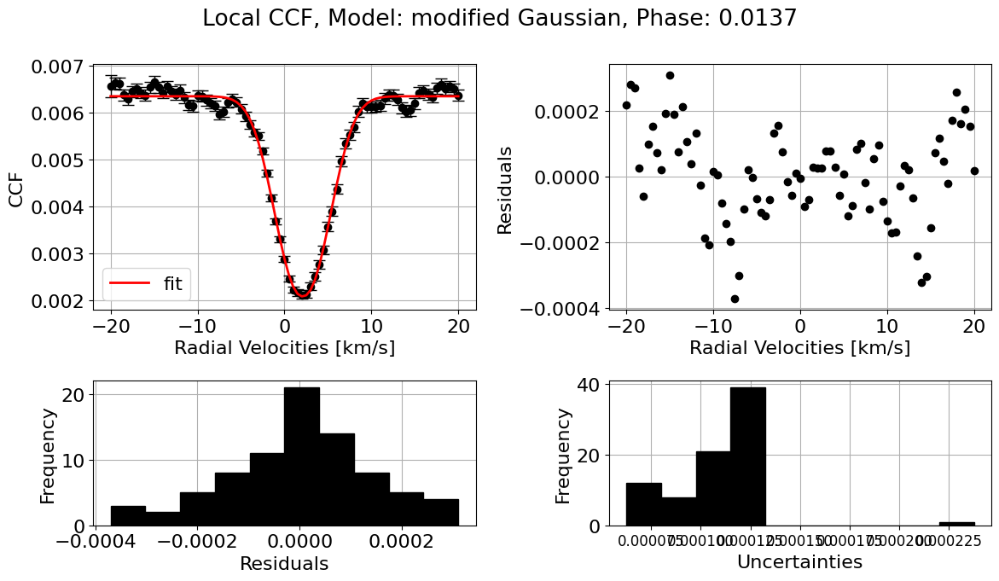

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0156
------------------------------
Fit parameters:
y0 = 0.001528 ± 0.000016
x0 = 1.899201 ± 0.083819
sigma = 2.934230 ± 0.135086
a = 0.001134 ± 0.000039
c = 2.535084 ± 0.279107
R^2:  0.931
------------------------------
CCF parameters:
Central RV [km/s]: 1.899201 ± 0.083819
Continuum: 0.001528 ± 0.000016
Deph [%]: 25.794857 ± 2.642514
Width [km/s]: 2.934230 ± 0.135086


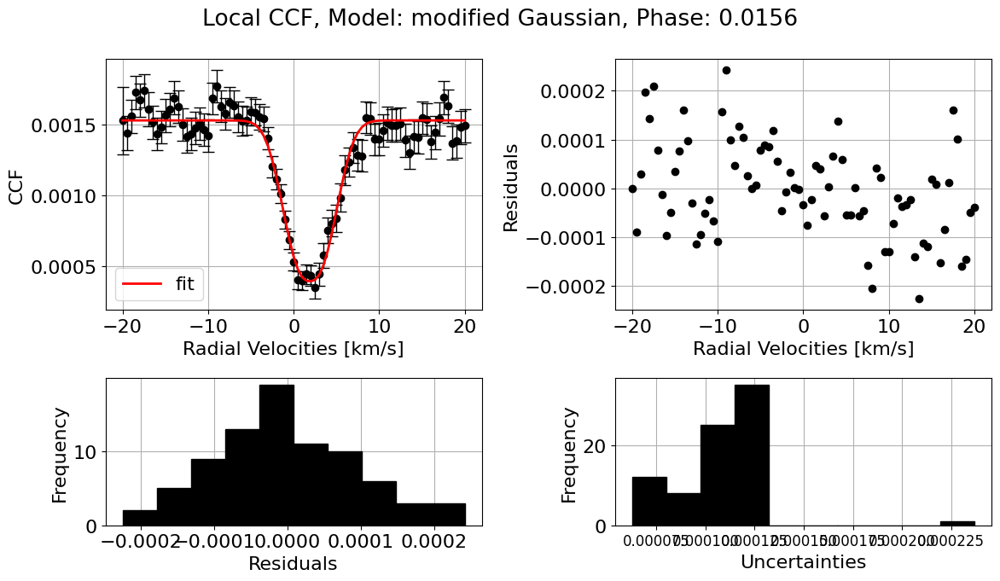

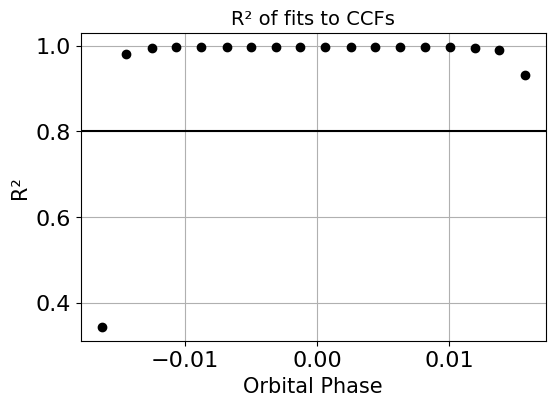

In [9]:
central_rv_array, continuum_array, depth_array, width_array, R2_array = hecate.CCF_parameters(CCFs=local_CCFs, ccf_type="local", model="modified Gaussian", print_output=True, plot_fit=True, save=None)

In [10]:
indices_final = np.arange(2,len(hecate.in_phases)-2)

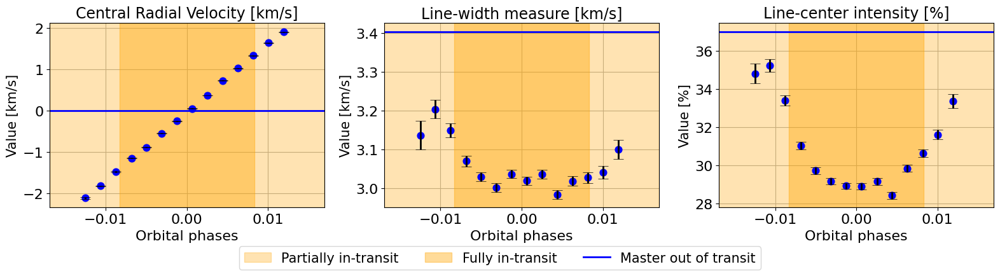

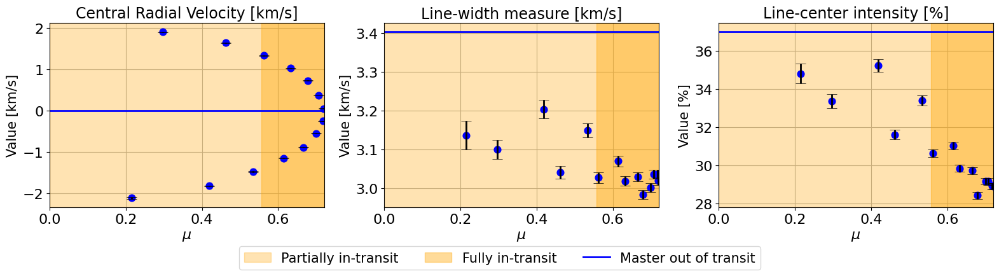

In [11]:
local_params = [central_rv_array, width_array, depth_array]
master_params = [master_central_rv_array, master_width_array, master_depth_array]

hecate.plot_local_params(indices_final, local_params, master_params, linear_fit=False, plot_nested=False, save=None)

Central Radial Velocity [km/s]
----------------------------------------
Orbital phases


19469it [00:18, 1073.68it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 402377 | eff(%):  4.710 | loglstar: 41.685 < 47.067 < 46.446 | logz: 30.067 +/-  0.112 | stop:  0.900]             
14178it [00:10, 1338.76it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 268860 | eff(%):  5.075 | loglstar: -16.573 < -10.871 < -11.628 | logz: -17.841 +/-  0.068 | stop:  0.937]        


------------------------------
Linear vs Constant
logZ(linear)   = 30.070 ± 0.102
logZ(constant) = -17.841 ± 0.062
log Bayes factor = 47.911
Unconstrained model favored.
------------------------------


18964it [00:16, 1149.58it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 390331 | eff(%):  4.725 | loglstar: 41.800 < 47.067 < 46.384 | logz: 31.075 +/-  0.107 | stop:  0.899]             
16825it [00:14, 1150.78it/s, batch: 6 | bound: 7 | nc: 1 | ncall: 342105 | eff(%):  4.765 | loglstar: -17.068 < -9.371 < -11.219 | logz: -20.523 +/-  0.089 | stop:  0.803]          


Positive vs Negative slope
logZ(m>0)  = 31.099 ± 0.099
logZ(m<0)  = -20.503 ± 0.081
log Bayes factor = -51.602
Positive slope favored.
Linear fit parameters:
m = 166.409101 +/- 1.109881
b = -0.036080 +/- 0.004139
ln_f = -3.804323 +/- 0.268545
------------------------------
{'x': array([-0.0124982 , -0.0106569 , -0.008787  , -0.00682509, -0.00500114,
       -0.00311627, -0.00126897,  0.0006282 ,  0.00254259,  0.00440799,
        0.00626933,  0.00817742,  0.01004104,  0.01192976]), 'label': 'Orbital phases', 'x_grid': array([-1.24982002e-02, -1.22514531e-02, -1.20047060e-02, -1.17579589e-02,
       -1.15112118e-02, -1.12644647e-02, -1.10177177e-02, -1.07709706e-02,
       -1.05242235e-02, -1.02774764e-02, -1.00307293e-02, -9.78398220e-03,
       -9.53723511e-03, -9.29048802e-03, -9.04374093e-03, -8.79699384e-03,
       -8.55024675e-03, -8.30349966e-03, -8.05675257e-03, -7.81000548e-03,
       -7.56325839e-03, -7.31651130e-03, -7.06976421e-03, -6.82301712e-03,
       -6.57627003e-03, -6.3

17836it [00:12, 1396.76it/s, batch: 6 | bound: 6 | nc: 1 | ncall: 365271 | eff(%):  4.740 | loglstar: -12.905 < -6.692 < -7.524 | logz: -20.531 +/-  0.105 | stop:  0.869]          
14560it [00:13, 1100.30it/s, batch: 7 | bound: 5 | nc: 1 | ncall: 276455 | eff(%):  5.074 | loglstar: -16.560 < -10.864 < -11.251 | logz: -17.985 +/-  0.070 | stop:  0.925]         


------------------------------
Linear vs Constant
logZ(linear)   = -20.538 ± 0.092
logZ(constant) = -18.012 ± 0.062
log Bayes factor = -2.527
Zero-slope model favored
Linear fit parameters:
b = -0.537772 +/- 0.719812
ln_f = 0.767047 +/- 0.213403
------------------------------
{'x': array([0.21478021, 0.41843738, 0.53401879, 0.61481643, 0.665893  ,
       0.69988244, 0.71723183, 0.71979958, 0.70688576, 0.67848688,
       0.63250622, 0.56258937, 0.46224803, 0.29684137]), 'label': '$\\mu$', 'x_grid': array([0.21478021, 0.21988142, 0.22498262, 0.23008383, 0.23518503,
       0.24028624, 0.24538745, 0.25048865, 0.25558986, 0.26069106,
       0.26579227, 0.27089347, 0.27599468, 0.28109589, 0.28619709,
       0.2912983 , 0.2963995 , 0.30150071, 0.30660191, 0.31170312,
       0.31680433, 0.32190553, 0.32700674, 0.33210794, 0.33720915,
       0.34231036, 0.34741156, 0.35251277, 0.35761397, 0.36271518,
       0.36781638, 0.37291759, 0.3780188 , 0.38312   , 0.38822121,
       0.39332241, 0.3984236

17420it [00:14, 1170.94it/s, batch: 6 | bound: 3 | nc: 1 | ncall: 354877 | eff(%):  4.761 | loglstar: 30.019 < 35.059 < 34.028 | logz: 20.368 +/-  0.105 | stop:  0.961]             
17616it [00:13, 1280.38it/s, batch: 8 | bound: 4 | nc: 1 | ncall: 344817 | eff(%):  4.958 | loglstar: 27.491 < 32.458 < 32.185 | logz: 21.191 +/-  0.083 | stop:  0.867]           


------------------------------
Linear vs Constant
logZ(linear)   = 20.354 ± 0.098
logZ(constant) = 21.195 ± 0.077
log Bayes factor = -0.842
Zero-slope model favored
Linear fit parameters:
b = 3.057228 +/- 0.016496
ln_f = -3.942023 +/- 0.229965
------------------------------
{'x': array([-0.0124982 , -0.0106569 , -0.008787  , -0.00682509, -0.00500114,
       -0.00311627, -0.00126897,  0.0006282 ,  0.00254259,  0.00440799,
        0.00626933,  0.00817742,  0.01004104,  0.01192976]), 'label': 'Orbital phases', 'x_grid': array([-1.24982002e-02, -1.22514531e-02, -1.20047060e-02, -1.17579589e-02,
       -1.15112118e-02, -1.12644647e-02, -1.10177177e-02, -1.07709706e-02,
       -1.05242235e-02, -1.02774764e-02, -1.00307293e-02, -9.78398220e-03,
       -9.53723511e-03, -9.29048802e-03, -9.04374093e-03, -8.79699384e-03,
       -8.55024675e-03, -8.30349966e-03, -8.05675257e-03, -7.81000548e-03,
       -7.56325839e-03, -7.31651130e-03, -7.06976421e-03, -6.82301712e-03,
       -6.57627003e-03, -6.

20222it [00:21, 957.83it/s, batch: 7 | bound: 5 | nc: 1 | ncall: 419387 | eff(%):  4.699 | loglstar: 32.117 < 37.438 < 37.095 | logz: 18.907 +/-  0.121 | stop:  0.902]              
16391it [00:15, 1037.10it/s, batch: 8 | bound: 4 | nc: 1 | ncall: 318263 | eff(%):  4.986 | loglstar: 27.761 < 32.458 < 32.283 | logz: 21.136 +/-  0.088 | stop:  0.972]           


------------------------------
Linear vs Constant
logZ(linear)   = 18.922 ± 0.107
logZ(constant) = 21.150 ± 0.080
log Bayes factor = -2.228
Zero-slope model favored
Linear fit parameters:
b = 3.057377 +/- 0.016927
ln_f = -3.944332 +/- 0.223790
------------------------------
{'x': array([0.21478021, 0.41843738, 0.53401879, 0.61481643, 0.665893  ,
       0.69988244, 0.71723183, 0.71979958, 0.70688576, 0.67848688,
       0.63250622, 0.56258937, 0.46224803, 0.29684137]), 'label': '$\\mu$', 'x_grid': array([0.21478021, 0.21988142, 0.22498262, 0.23008383, 0.23518503,
       0.24028624, 0.24538745, 0.25048865, 0.25558986, 0.26069106,
       0.26579227, 0.27089347, 0.27599468, 0.28109589, 0.28619709,
       0.2912983 , 0.2963995 , 0.30150071, 0.30660191, 0.31170312,
       0.31680433, 0.32190553, 0.32700674, 0.33210794, 0.33720915,
       0.34231036, 0.34741156, 0.35251277, 0.35761397, 0.36271518,
       0.36781638, 0.37291759, 0.3780188 , 0.38312   , 0.38822121,
       0.39332241, 0.39842362,

14385it [00:12, 1125.84it/s, batch: 6 | bound: 3 | nc: 1 | ncall: 285288 | eff(%):  4.855 | loglstar: -22.421 < -17.068 < -18.231 | logz: -25.725 +/-  0.077 | stop:  0.976]         
15936it [00:12, 1241.09it/s, batch: 8 | bound: 3 | nc: 1 | ncall: 307130 | eff(%):  5.017 | loglstar: -23.388 < -18.185 < -18.696 | logz: -25.997 +/-  0.067 | stop:  0.861]         


------------------------------
Linear vs Constant
logZ(linear)   = -25.720 ± 0.073
logZ(constant) = -25.987 ± 0.063
log Bayes factor = 0.267
Zero-slope model favored
Linear fit parameters:
b = 30.982337 +/- 0.641565
ln_f = -2.586368 +/- 0.205070
------------------------------
{'x': array([-0.0124982 , -0.0106569 , -0.008787  , -0.00682509, -0.00500114,
       -0.00311627, -0.00126897,  0.0006282 ,  0.00254259,  0.00440799,
        0.00626933,  0.00817742,  0.01004104,  0.01192976]), 'label': 'Orbital phases', 'x_grid': array([-1.24982002e-02, -1.22514531e-02, -1.20047060e-02, -1.17579589e-02,
       -1.15112118e-02, -1.12644647e-02, -1.10177177e-02, -1.07709706e-02,
       -1.05242235e-02, -1.02774764e-02, -1.00307293e-02, -9.78398220e-03,
       -9.53723511e-03, -9.29048802e-03, -9.04374093e-03, -8.79699384e-03,
       -8.55024675e-03, -8.30349966e-03, -8.05675257e-03, -7.81000548e-03,
       -7.56325839e-03, -7.31651130e-03, -7.06976421e-03, -6.82301712e-03,
       -6.57627003e-03, -

17286it [00:14, 1203.11it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 350898 | eff(%):  4.776 | loglstar: -11.655 < -6.136 < -6.769 | logz: -18.569 +/-  0.094 | stop:  0.888]          
15463it [00:11, 1377.76it/s, batch: 8 | bound: 3 | nc: 1 | ncall: 297594 | eff(%):  5.019 | loglstar: -23.260 < -18.185 < -18.706 | logz: -25.789 +/-  0.066 | stop:  0.890]        


------------------------------
Linear vs Constant
logZ(linear)   = -18.573 ± 0.086
logZ(constant) = -25.789 ± 0.063
log Bayes factor = 7.216
Unconstrained model favored.
------------------------------


17858it [00:15, 1129.28it/s, batch: 7 | bound: 5 | nc: 1 | ncall: 364784 | eff(%):  4.752 | loglstar: -24.673 < -18.200 < -19.111 | logz: -30.159 +/-  0.090 | stop:  0.817]         
16621it [00:13, 1260.46it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 336393 | eff(%):  4.784 | loglstar: -11.682 < -6.139 < -6.767 | logz: -17.489 +/-  0.090 | stop:  0.905]           


Positive vs Negative slope
logZ(m>0)  = -30.154 ± 0.083
logZ(m<0)  = -17.492 ± 0.082
log Bayes factor = 12.662
Negative slope favored.
Linear fit parameters:
m = -13.378897 +/- 1.959481
b = 38.578554 +/- 1.194632
ln_f = -3.435216 +/- 0.223222
------------------------------
{'x': array([0.21478021, 0.41843738, 0.53401879, 0.61481643, 0.665893  ,
       0.69988244, 0.71723183, 0.71979958, 0.70688576, 0.67848688,
       0.63250622, 0.56258937, 0.46224803, 0.29684137]), 'label': '$\\mu$', 'x_grid': array([0.21478021, 0.21988142, 0.22498262, 0.23008383, 0.23518503,
       0.24028624, 0.24538745, 0.25048865, 0.25558986, 0.26069106,
       0.26579227, 0.27089347, 0.27599468, 0.28109589, 0.28619709,
       0.2912983 , 0.2963995 , 0.30150071, 0.30660191, 0.31170312,
       0.31680433, 0.32190553, 0.32700674, 0.33210794, 0.33720915,
       0.34231036, 0.34741156, 0.35251277, 0.35761397, 0.36271518,
       0.36781638, 0.37291759, 0.3780188 , 0.38312   , 0.38822121,
       0.39332241, 0.39842362, 

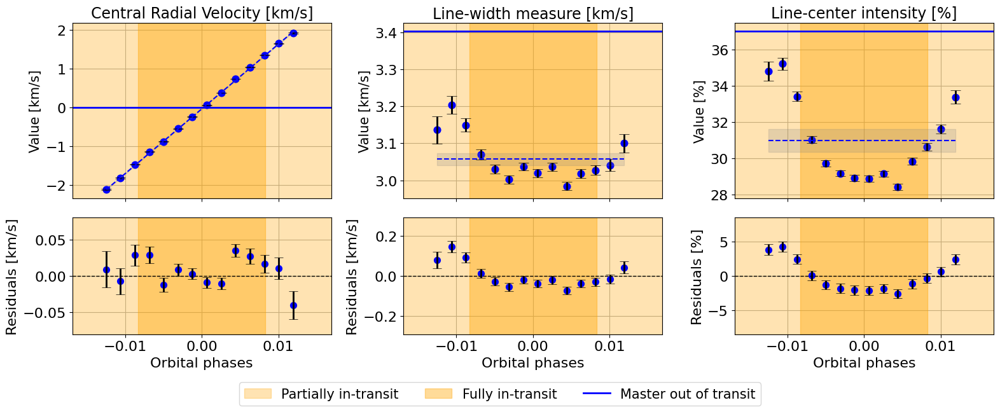

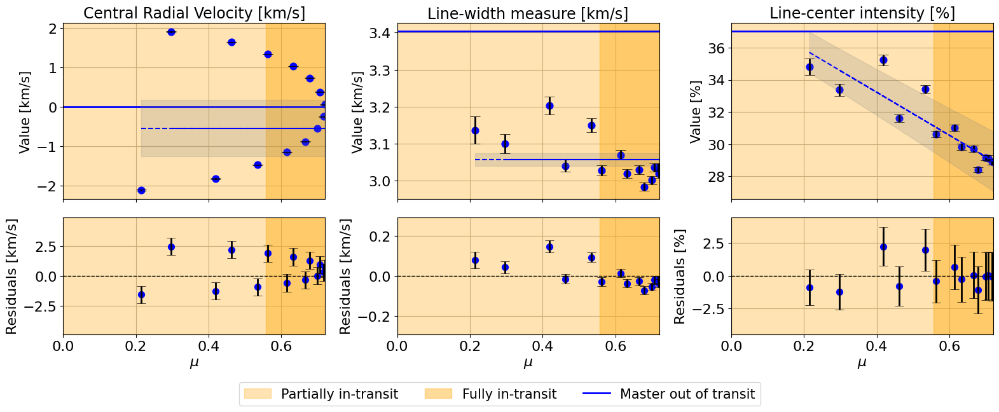

In [12]:
hecate.plot_local_params(indices_final, local_params, master_params, linear_fit=True, plot_nested=False, save=None)

# Strong Fe I lines

In [3]:
from get_data import *

spectra, time, airmass, berv, bervmax, snr, list_spectra = get_spectra()
CCFs, _, _, _, _, _, _ = get_CCFs(planet_params, plot=False)

In [4]:
mask = np.array([4365.9004, 5250.6527, 6027.0562,
4432.5726, 5253.4693, 6056.0114, 4445.4760, 5365.4063, 6065.4921,
4523.4015, 5367.4755, 6151.6217, 4574.2191, 5369.9702, 6157.7331,
4602.0006, 5373.7136, 6173.3433, 4678.8519, 5379.5796, 6180.2084,
4741.5341, 5389.4866, 6200.3204, 4839.5500, 5432.9525, 6213.4375,
4874.3565, 5445.0502, 6219.2886, 4875.8815, 5473.9076, 6232.6493,
4885.4361, 5525.5472, 6265.1412, 4892.8624, 5543.9399, 6270.2322,
4909.3874, 5638.2675, 6297.8013, 4918.0152, 5662.5233, 6322.6936,
4946.3941, 5701.5527, 6335.3378, 4950.1108, 5705.4677, 6408.0262,
4983.2566, 5717.8379, 6430.8538, 5044.2164, 5731.7666, 6481.8784, 
5090.7807, 5753.1287, 6498.9461, 5141.7460, 5775.0849, 6593.8798, 
5242.4988, 5916.2535, 6609.1189, 5243.7823, 5956.6997, 6750.1597, 
5250.2171, 6007.9656, 6855.1684]) #air wavelengths

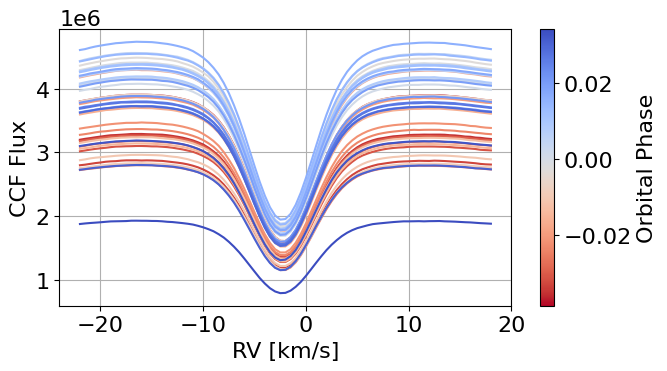

In [5]:
RV_reference = CCFs[0,2,:] #same as in white light CCF

CCFs_strong_iron = build_CCF(time, planet_params, spectra, RV_reference, mask, berv, bervmax, plot=True).CCFs

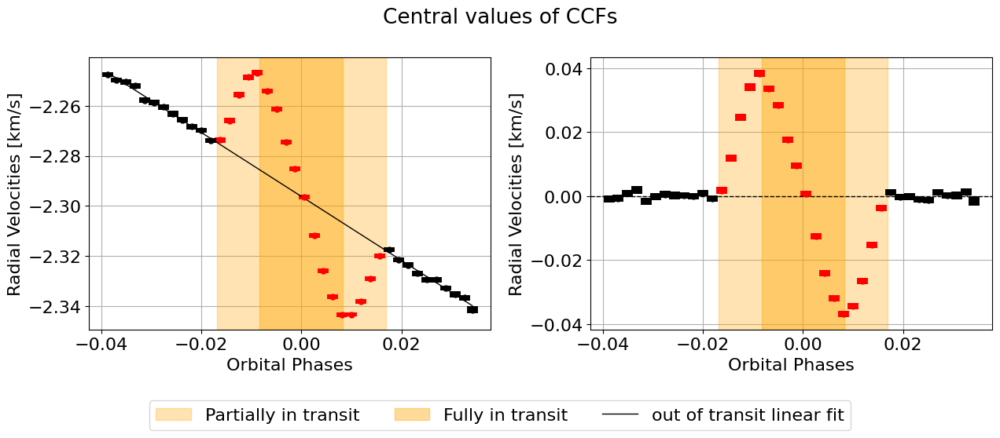

In [8]:
rm_corr = sysvel_correction(planet_params, time, CCFs_strong_iron, model="modified Gaussian", plot_fits=False, plot_sys_vel=True)

CCFs_sysvel_corr = rm_corr.CCFs_sysvel_corr
x0_corr = rm_corr.x0_corr

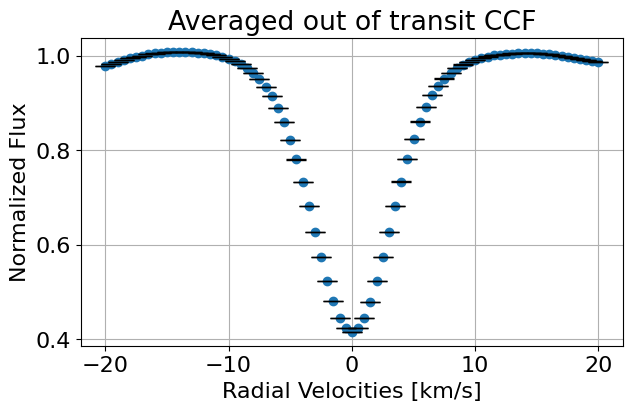

In [9]:
hecate = HECATE(planet_params, stellar_params, time, CCFs_sysvel_corr)

RV_reference = np.arange(round(np.max(CCFs_sysvel_corr[:,2,0])), round(np.min(CCFs_sysvel_corr[:,2,-1]))+0.5, 0.5)

CCF_interp, avg_out_of_transit_CCF = hecate._avg_out_of_transit_CCF(CCFs_sysvel_corr, RV_reference, plot=True, save=None)

##############################
FITTING modified Gaussian model TO master CCF
------------------------------
Fit parameters:
y0 = 1.000316 ± 0.000014
x0 = 0.000051 ± 0.000167
sigma = 3.155957 ± 0.000307
a = 0.587415 ± 0.000036
c = 1.882114 ± 0.000320
R^2:  0.9991
------------------------------
CCF parameters:
Central RV [km/s]: 0.000051 ± 0.000167
Continuum: 1.000316 ± 0.000014
Deph [%]: 41.277026 ± 0.003661
Width [km/s]: 3.155957 ± 0.000307


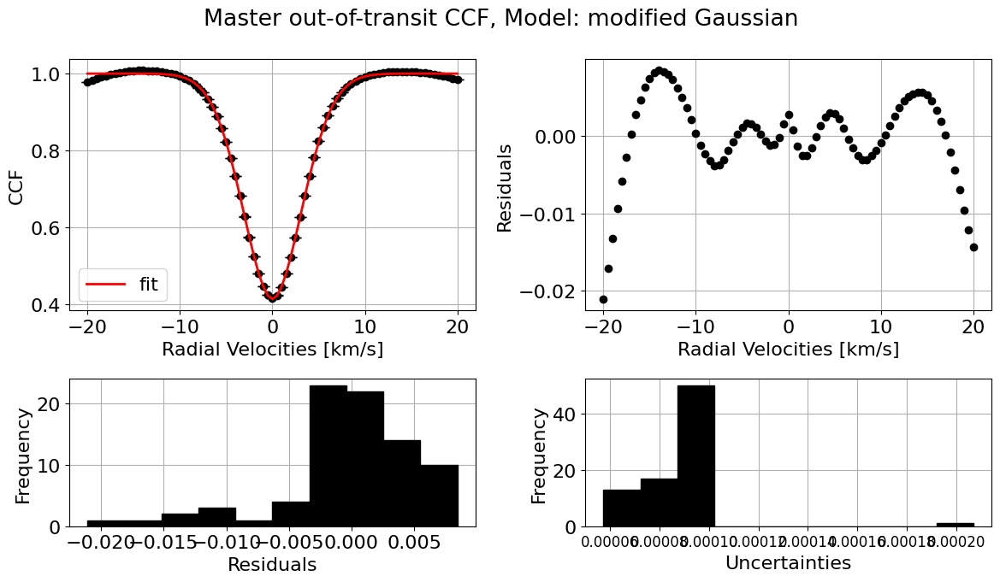

In [10]:
master_central_rv_array, master_continuum_array, master_depth_array, master_width_array, master_R2_array = hecate._CCF_parameters(CCFs=avg_out_of_transit_CCF, ccf_type="master", model="modified Gaussian", print_output=True, plot_fit=True, save=None)

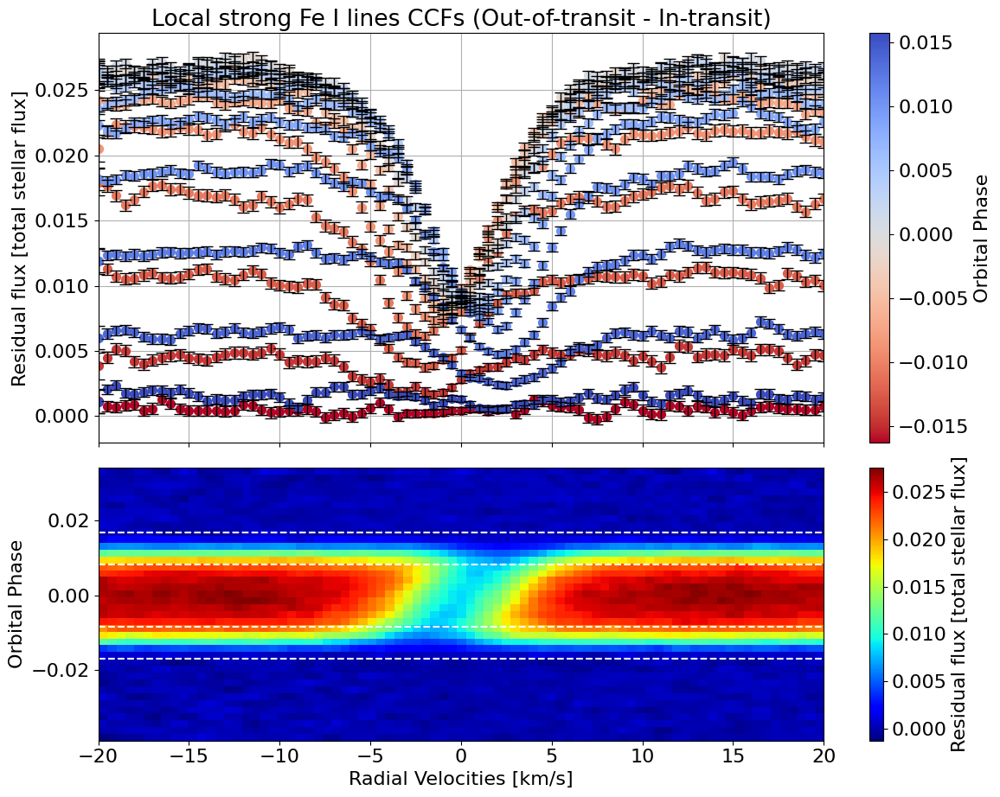

In [12]:
hecate = HECATE(planet_params, stellar_params, time, CCFs_strong_iron)

ccf_type = "strong Fe I lines"
model_fit = "modified Gaussian"
plot = {"SOAP":False, "fits_initial_CCF":False, "sys_vel":False, "avg_out_of_transit_CCF":False, "local_CCFs":True}

local_CCFs, CCFs_sub_all, CCFs_flux_corr, phases, in_phases = hecate._extract_local_CCF(model_fit, ccf_type, plot, save=None)

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.016
------------------------------
Fit parameters:
y0 = 0.001021 ± 0.017663
x0 = -3.336151 ± 0.475094
sigma = 0.000000 ± 0.000062
a = 0.005324 ± 0.622956
c = 0.079460 ± 6.054284
R^2:  0.1062
------------------------------
CCF parameters:
Central RV [km/s]: -3.336151 ± 0.475094
Continuum: 0.001021 ± 0.017663
Deph [%]: -421.639716 ± 61703.696268
Width [km/s]: 0.000000 ± 0.000062


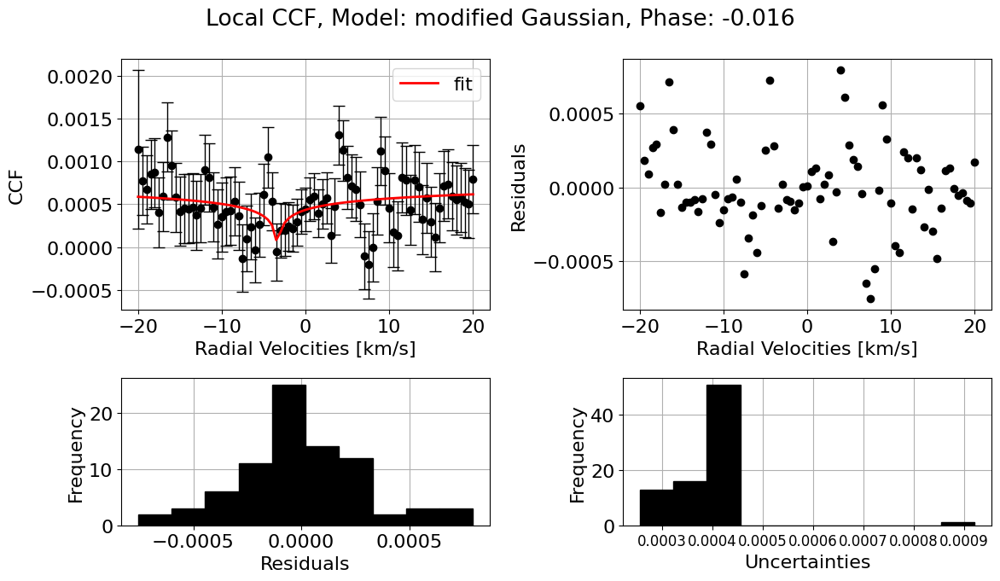

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.014
------------------------------
Fit parameters:
y0 = 0.004674 ± 0.000060
x0 = -2.468441 ± 0.144101
sigma = 2.847231 ± 0.249675
a = 0.002816 ± 0.000178
c = 2.333195 ± 0.434356
R^2:  0.8718
------------------------------
CCF parameters:
Central RV [km/s]: -2.468441 ± 0.144101
Continuum: 0.004674 ± 0.000060
Deph [%]: 39.746946 ± 3.875918
Width [km/s]: 2.847231 ± 0.249675


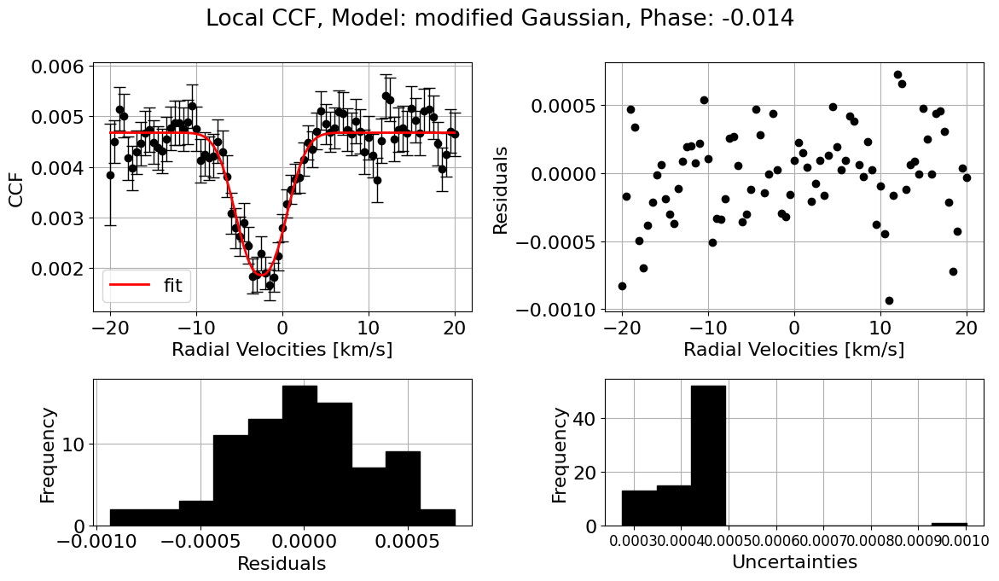

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.012
------------------------------
Fit parameters:
y0 = 0.010719 ± 0.000063
x0 = -2.177755 ± 0.062434
sigma = 2.846041 ± 0.116385
a = 0.006994 ± 0.000187
c = 1.951674 ± 0.140046
R^2:  0.9748
------------------------------
CCF parameters:
Central RV [km/s]: -2.177755 ± 0.062434
Continuum: 0.010719 ± 0.000063
Deph [%]: 34.752427 ± 1.781323
Width [km/s]: 2.846041 ± 0.116385


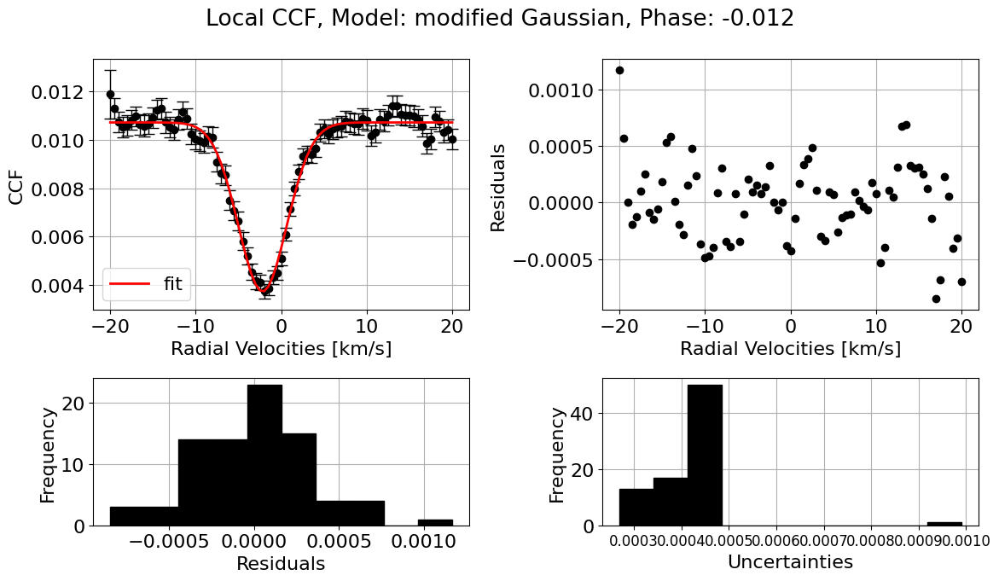

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.010
------------------------------
Fit parameters:
y0 = 0.016793 ± 0.000063
x0 = -1.861960 ± 0.040987
sigma = 2.774753 ± 0.074693
a = 0.010572 ± 0.000187
c = 2.029131 ± 0.100449
R^2:  0.9782
------------------------------
CCF parameters:
Central RV [km/s]: -1.861960 ± 0.040987
Continuum: 0.016793 ± 0.000063
Deph [%]: 37.045104 ± 1.140382
Width [km/s]: 2.774753 ± 0.074693


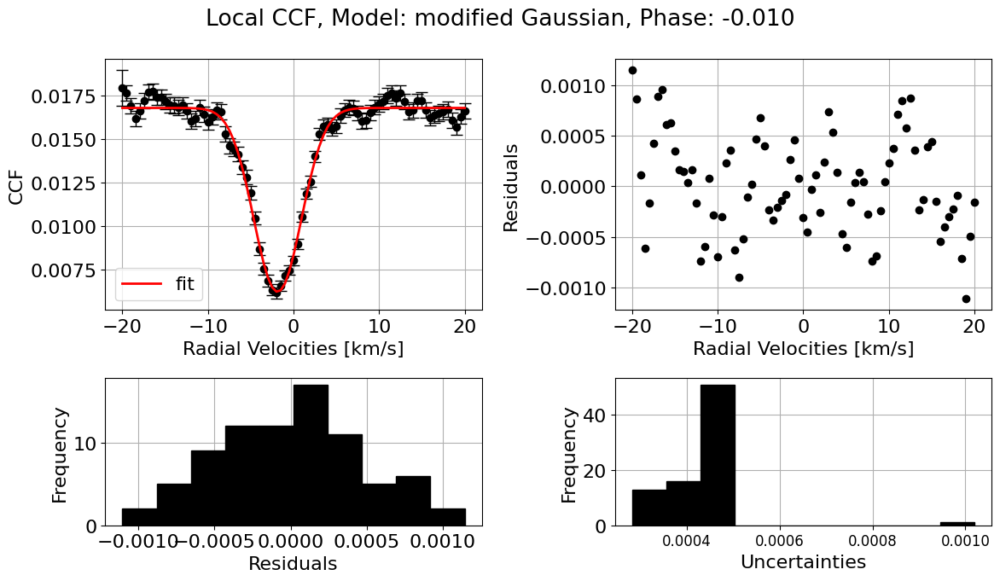

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.008
------------------------------
Fit parameters:
y0 = 0.021789 ± 0.000069
x0 = -1.537234 ± 0.032043
sigma = 2.700937 ± 0.062655
a = 0.014688 ± 0.000205
c = 1.715312 ± 0.061101
R^2:  0.9935
------------------------------
CCF parameters:
Central RV [km/s]: -1.537234 ± 0.032043
Continuum: 0.021789 ± 0.000069
Deph [%]: 32.590459 ± 0.965248
Width [km/s]: 2.700937 ± 0.062655


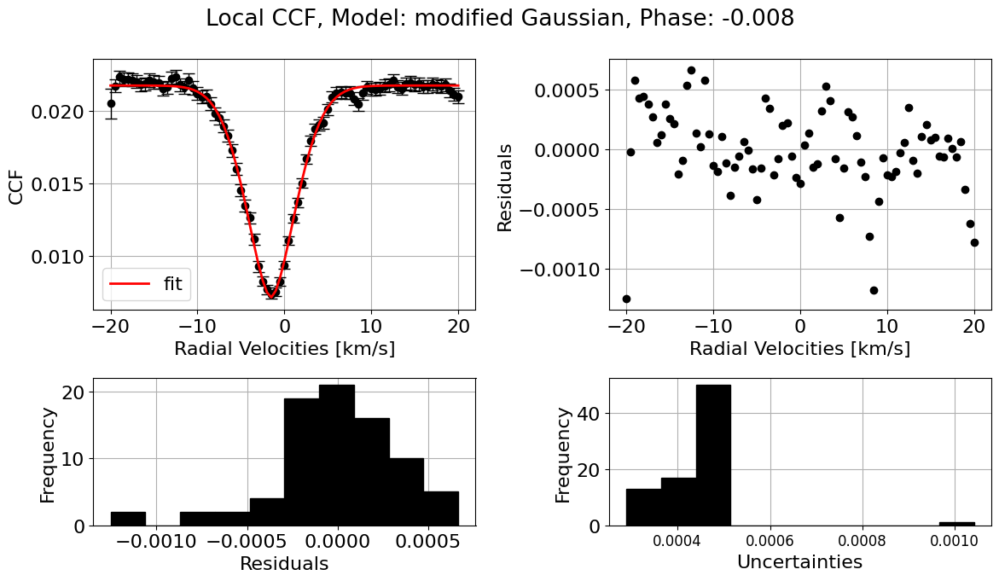

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.006
------------------------------
Fit parameters:
y0 = 0.024126 ± 0.000058
x0 = -1.180049 ± 0.024637
sigma = 2.728054 ± 0.046931
a = 0.015885 ± 0.000167
c = 1.816546 ± 0.051429
R^2:  0.9953
------------------------------
CCF parameters:
Central RV [km/s]: -1.180049 ± 0.024637
Continuum: 0.024126 ± 0.000058
Deph [%]: 34.156713 ± 0.711917
Width [km/s]: 2.728054 ± 0.046931


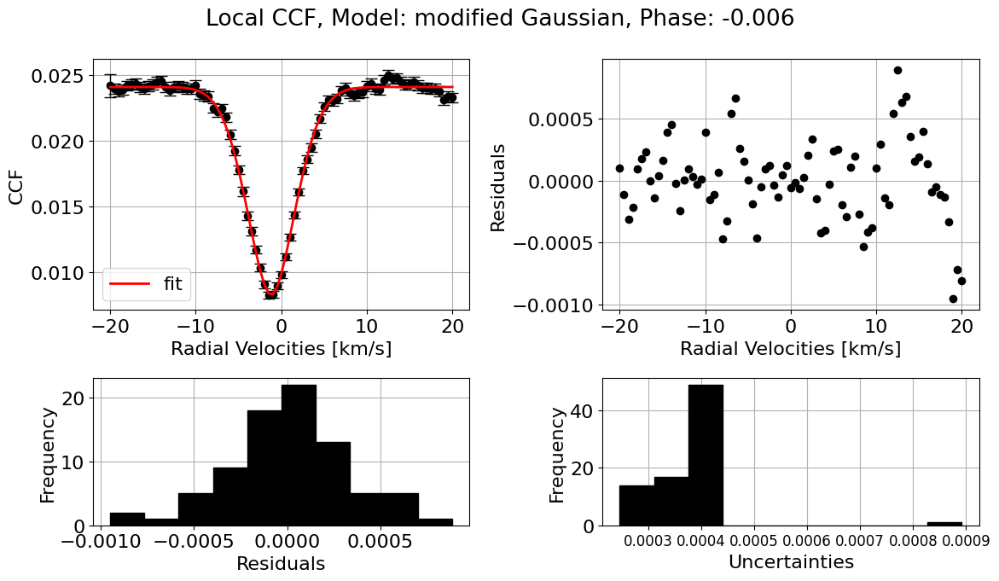

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.004
------------------------------
Fit parameters:
y0 = 0.025412 ± 0.000057
x0 = -0.855857 ± 0.020797
sigma = 2.494085 ± 0.041489
a = 0.017727 ± 0.000172
c = 1.685823 ± 0.042236
R^2:  0.9951
------------------------------
CCF parameters:
Central RV [km/s]: -0.855857 ± 0.020797
Continuum: 0.025412 ± 0.000057
Deph [%]: 30.240124 ± 0.695974
Width [km/s]: 2.494085 ± 0.041489


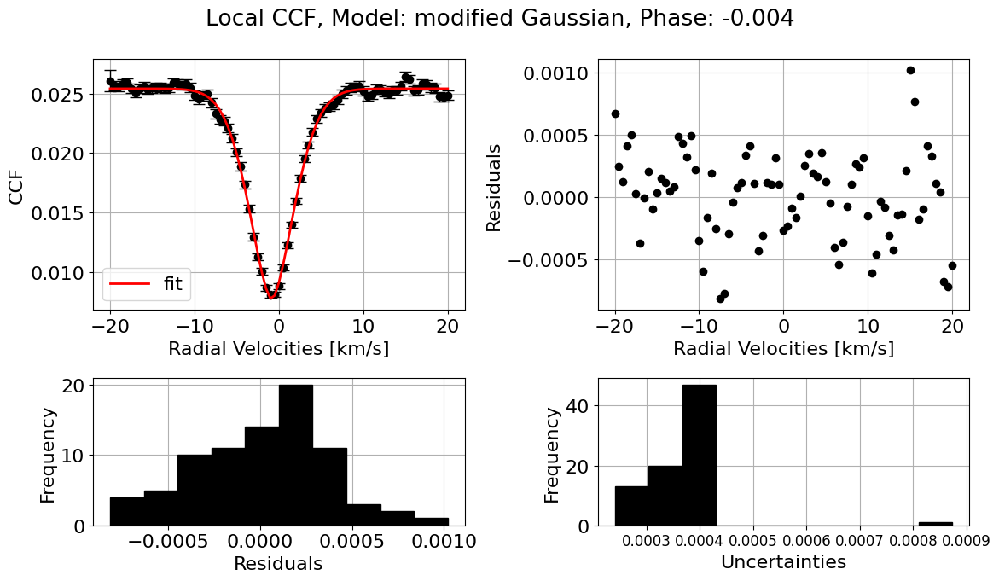

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.003
------------------------------
Fit parameters:
y0 = 0.026009 ± 0.000053
x0 = -0.523422 ± 0.019926
sigma = 2.630389 ± 0.037626
a = 0.017777 ± 0.000154
c = 1.826814 ± 0.043373
R^2:  0.9967
------------------------------
CCF parameters:
Central RV [km/s]: -0.523422 ± 0.019926
Continuum: 0.026009 ± 0.000053
Deph [%]: 31.651609 ± 0.609013
Width [km/s]: 2.630389 ± 0.037626


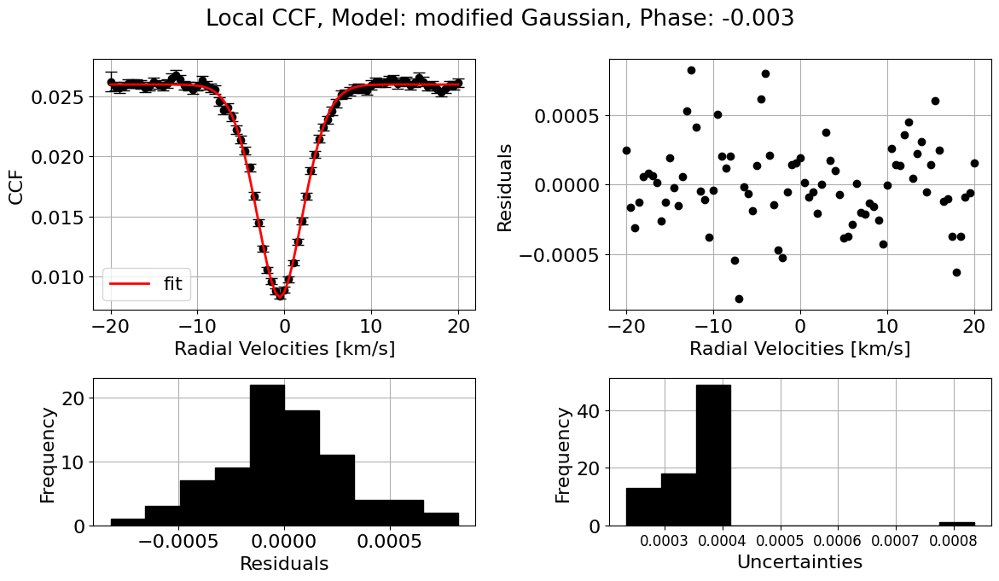

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.001
------------------------------
Fit parameters:
y0 = 0.026645 ± 0.000055
x0 = -0.272111 ± 0.020320
sigma = 2.737771 ± 0.038507
a = 0.018057 ± 0.000154
c = 1.819836 ± 0.042617
R^2:  0.9941
------------------------------
CCF parameters:
Central RV [km/s]: -0.272111 ± 0.020320
Continuum: 0.026645 ± 0.000055
Deph [%]: 32.230784 ± 0.594557
Width [km/s]: 2.737771 ± 0.038507


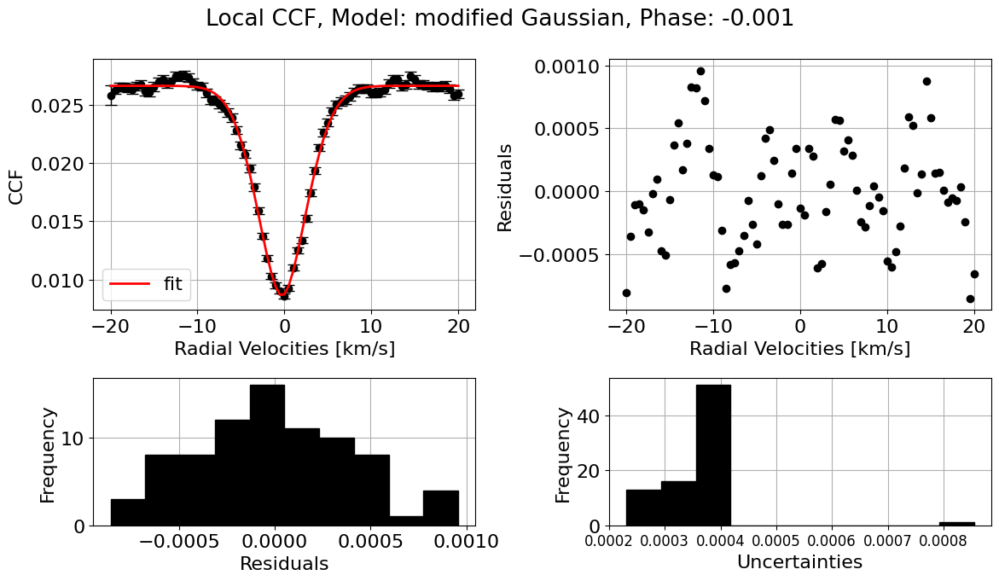

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0006
------------------------------
Fit parameters:
y0 = 0.026723 ± 0.000056
x0 = -0.017083 ± 0.020850
sigma = 2.742358 ± 0.038855
a = 0.018142 ± 0.000157
c = 1.864500 ± 0.045025
R^2:  0.9964
------------------------------
CCF parameters:
Central RV [km/s]: -0.017083 ± 0.020850
Continuum: 0.026723 ± 0.000056
Deph [%]: 32.110322 ± 0.605483
Width [km/s]: 2.742358 ± 0.038855


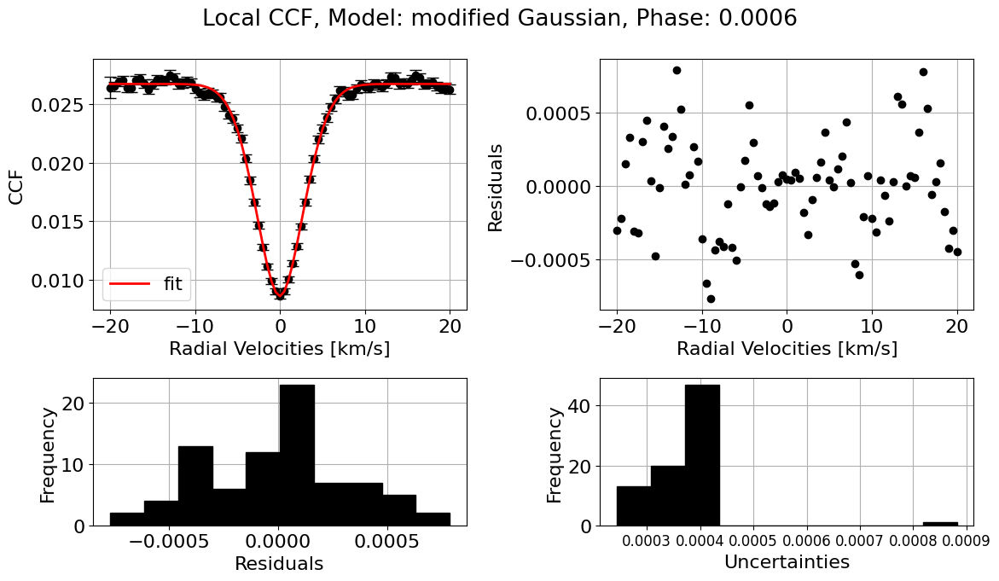

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0025
------------------------------
Fit parameters:
y0 = 0.026349 ± 0.000056
x0 = 0.364222 ± 0.020928
sigma = 2.716857 ± 0.039163
a = 0.017783 ± 0.000156
c = 1.857224 ± 0.045488
R^2:  0.9948
------------------------------
CCF parameters:
Central RV [km/s]: 0.364222 ± 0.020928
Continuum: 0.026349 ± 0.000056
Deph [%]: 32.507934 ± 0.609764
Width [km/s]: 2.716857 ± 0.039163


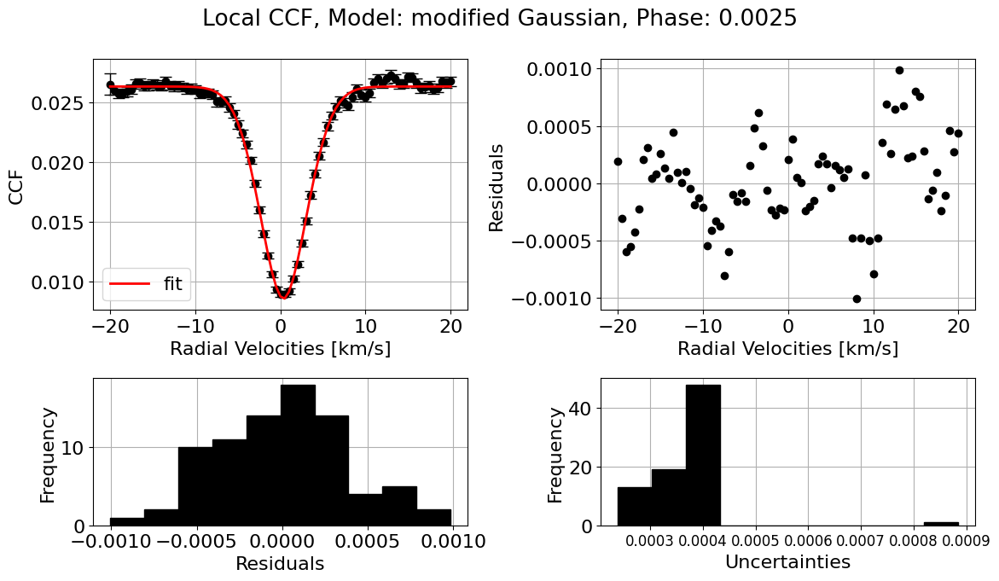

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0044
------------------------------
Fit parameters:
y0 = 0.025630 ± 0.000052
x0 = 0.726058 ± 0.020163
sigma = 2.632092 ± 0.037460
a = 0.017249 ± 0.000152
c = 1.900875 ± 0.046914
R^2:  0.9935
------------------------------
CCF parameters:
Central RV [km/s]: 0.726058 ± 0.020163
Continuum: 0.025630 ± 0.000052
Deph [%]: 32.700614 ± 0.608152
Width [km/s]: 2.632092 ± 0.037460


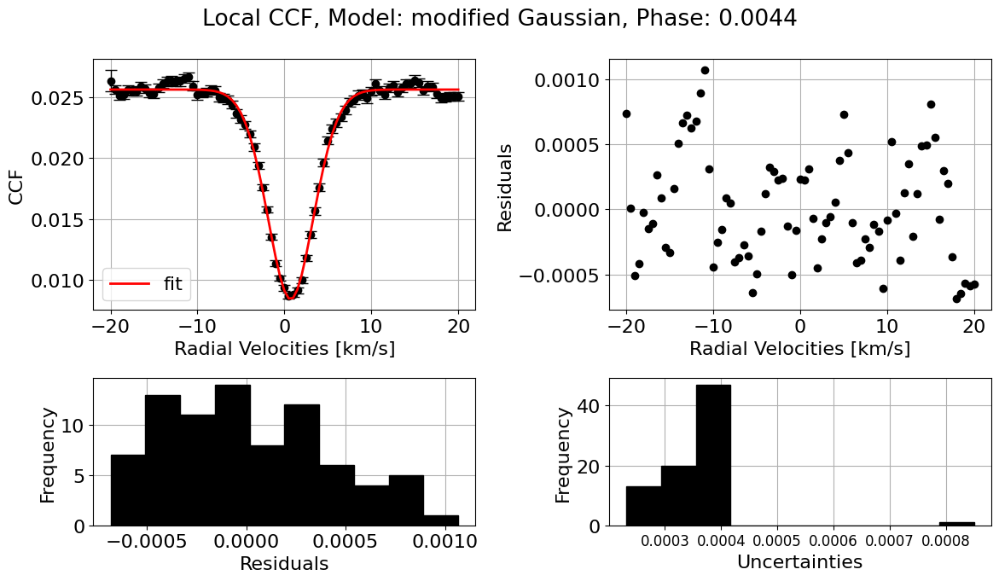

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0062
------------------------------
Fit parameters:
y0 = 0.024536 ± 0.000055
x0 = 1.046291 ± 0.022711
sigma = 2.703044 ± 0.042745
a = 0.016458 ± 0.000159
c = 1.839865 ± 0.048588
R^2:  0.9945
------------------------------
CCF parameters:
Central RV [km/s]: 1.046291 ± 0.022711
Continuum: 0.024536 ± 0.000055
Deph [%]: 32.923303 ± 0.665863
Width [km/s]: 2.703044 ± 0.042745


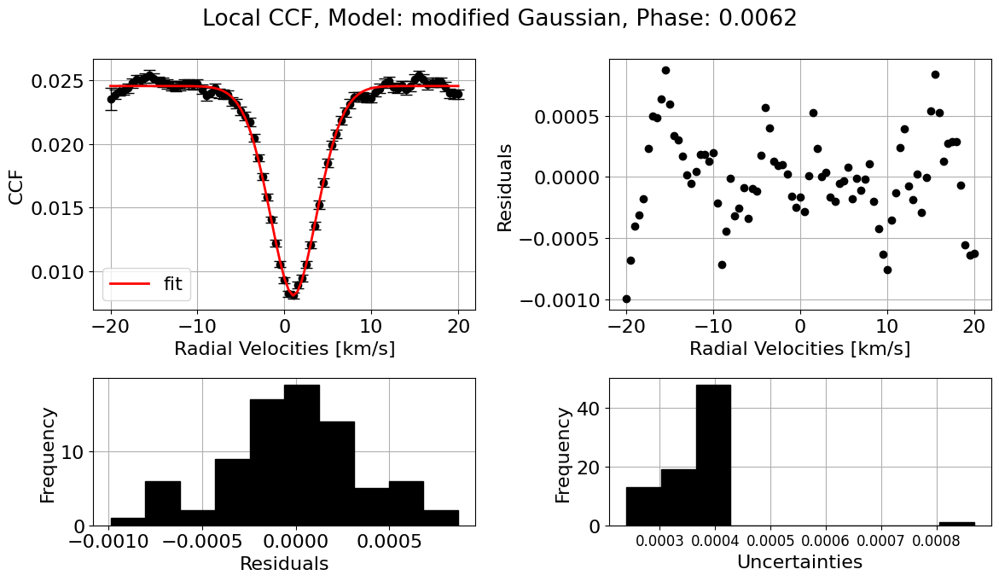

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0081
------------------------------
Fit parameters:
y0 = 0.022598 ± 0.000055
x0 = 1.397641 ± 0.025239
sigma = 2.673440 ± 0.047253
a = 0.014825 ± 0.000163
c = 1.879352 ± 0.056522
R^2:  0.9909
------------------------------
CCF parameters:
Central RV [km/s]: 1.397641 ± 0.025239
Continuum: 0.022598 ± 0.000055
Deph [%]: 34.397098 ± 0.737280
Width [km/s]: 2.673440 ± 0.047253


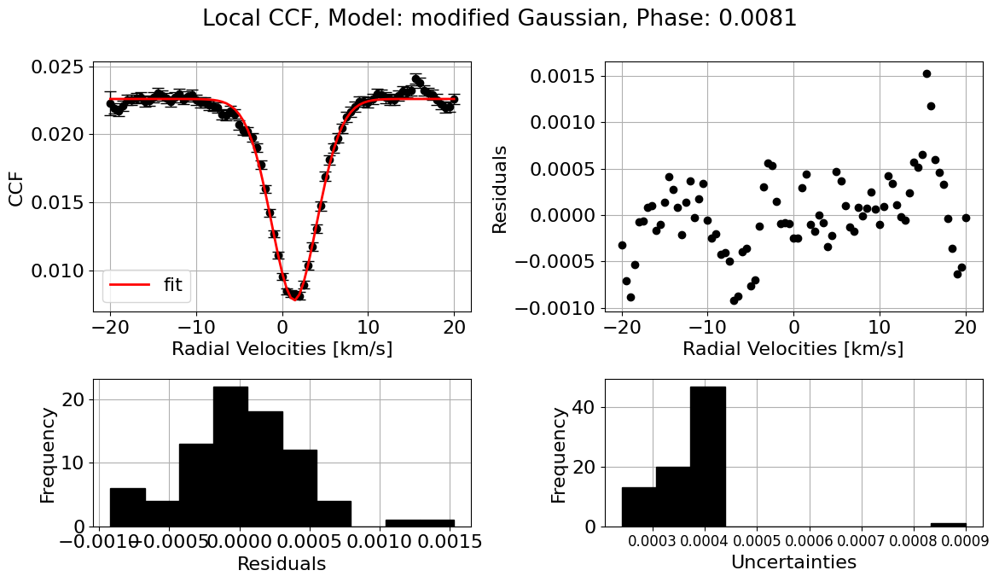

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0100
------------------------------
Fit parameters:
y0 = 0.018651 ± 0.000055
x0 = 1.715585 ± 0.031481
sigma = 2.694689 ± 0.059875
a = 0.011928 ± 0.000164
c = 1.843238 ± 0.067879
R^2:  0.9902
------------------------------
CCF parameters:
Central RV [km/s]: 1.715585 ± 0.031481
Continuum: 0.018651 ± 0.000055
Deph [%]: 36.048999 ± 0.901419
Width [km/s]: 2.694689 ± 0.059875


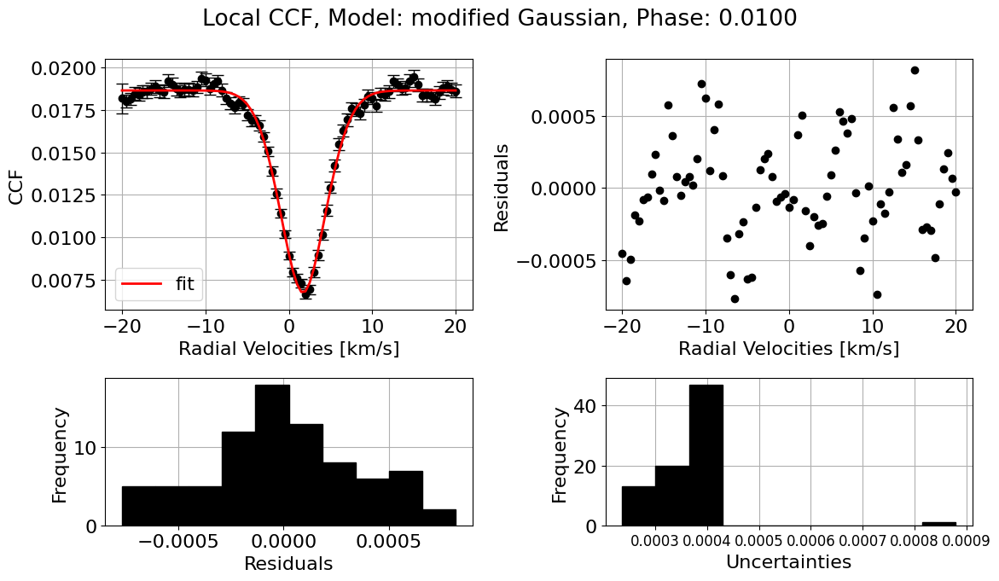

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0119
------------------------------
Fit parameters:
y0 = 0.012581 ± 0.000055
x0 = 2.068865 ± 0.047987
sigma = 2.735154 ± 0.089749
a = 0.007892 ± 0.000165
c = 1.917337 ± 0.108141
R^2:  0.9899
------------------------------
CCF parameters:
Central RV [km/s]: 2.068865 ± 0.047987
Continuum: 0.012581 ± 0.000055
Deph [%]: 37.276003 ± 1.343537
Width [km/s]: 2.735154 ± 0.089749


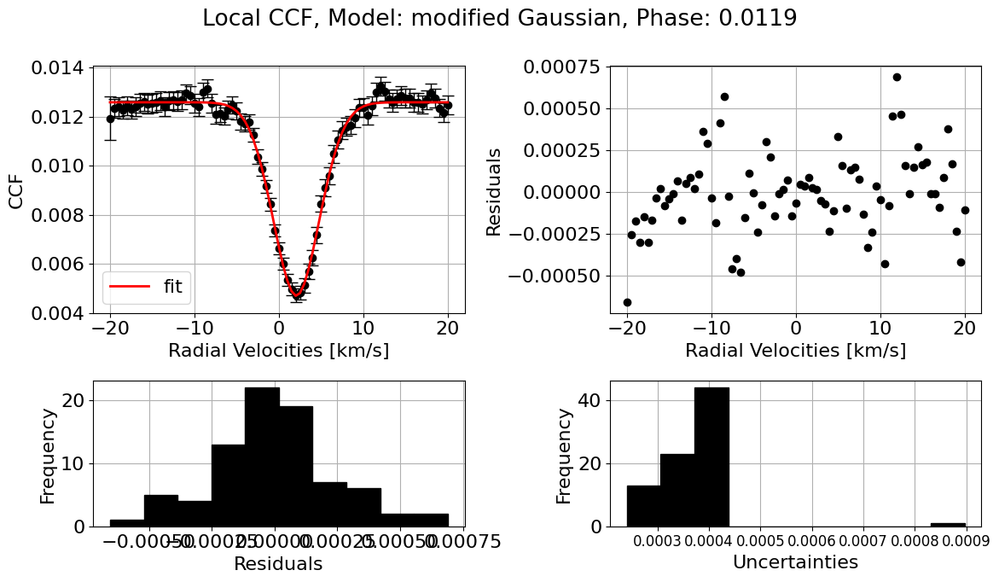

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0138
------------------------------
Fit parameters:
y0 = 0.006361 ± 0.000051
x0 = 2.344438 ± 0.089947
sigma = 2.931059 ± 0.150940
a = 0.003864 ± 0.000145
c = 2.445028 ± 0.284419
R^2:  0.9559
------------------------------
CCF parameters:
Central RV [km/s]: 2.344438 ± 0.089947
Continuum: 0.006361 ± 0.000051
Deph [%]: 39.253601 ± 2.334392
Width [km/s]: 2.931059 ± 0.150940


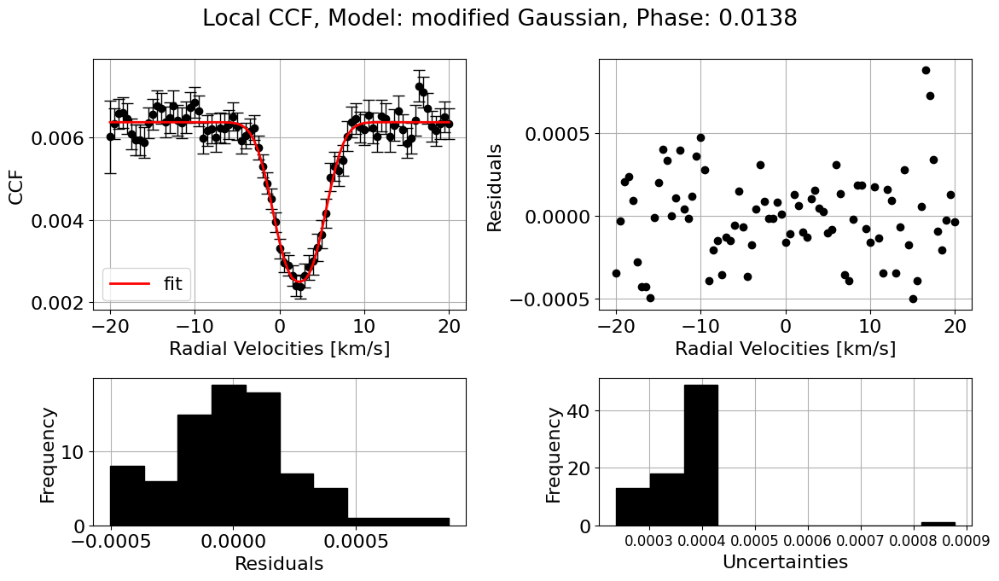

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0157
------------------------------
Fit parameters:
y0 = 0.001591 ± 0.000052
x0 = 1.975504 ± 0.313485
sigma = 1.823415 ± 0.660930
a = 0.001032 ± 0.000204
c = 1.513174 ± 0.693449
R^2:  0.3825
------------------------------
CCF parameters:
Central RV [km/s]: 1.975504 ± 0.313485
Continuum: 0.001591 ± 0.000052
Deph [%]: 35.152274 ± 13.025969
Width [km/s]: 1.823415 ± 0.660930


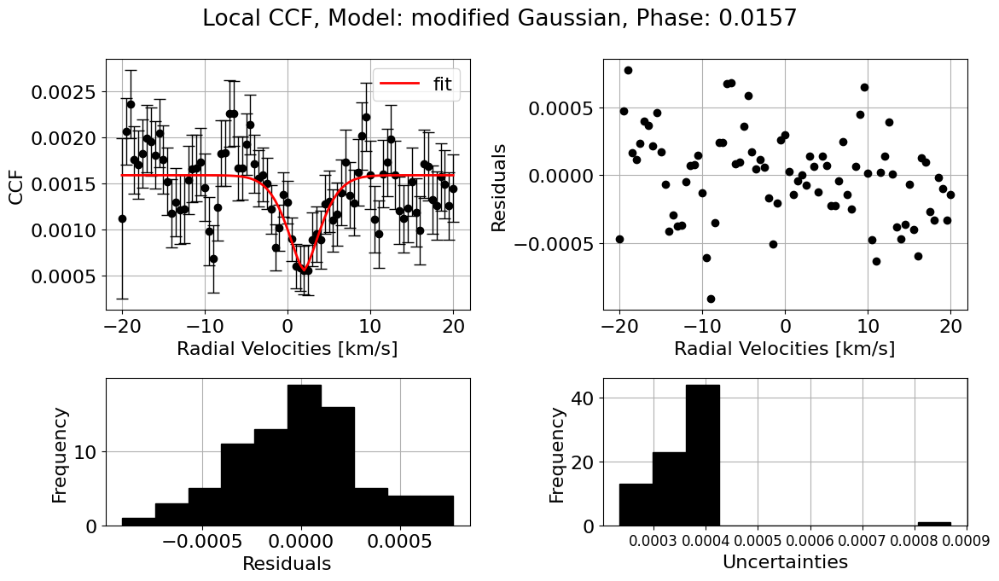

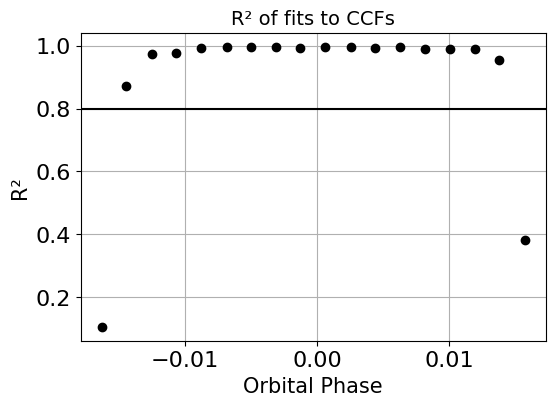

In [13]:
central_rv_array, continuum_array, depth_array, width_array, R2_array = hecate._CCF_parameters(CCFs=local_CCFs, ccf_type="local", model="modified Gaussian", print_output=True, plot_fit=True, save=None)

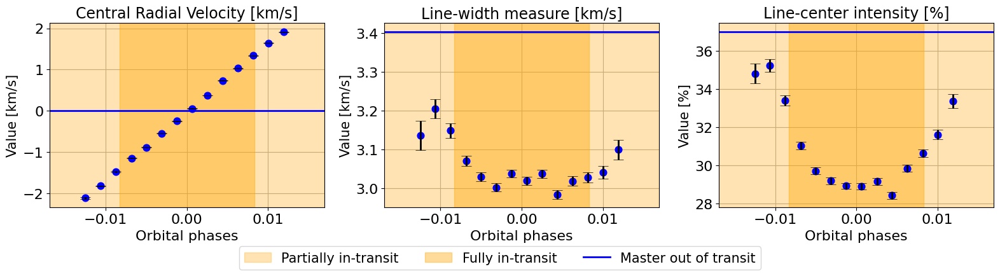

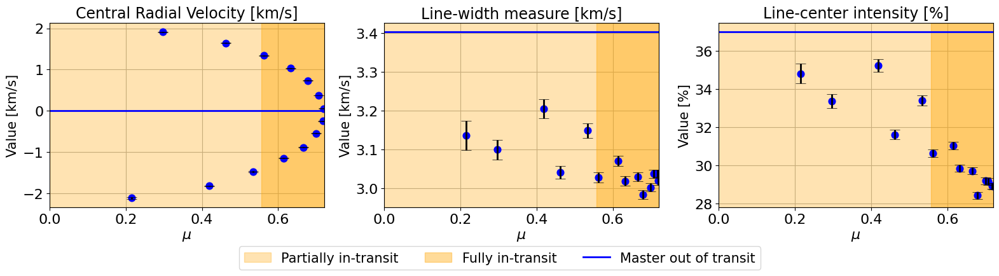

In [11]:
indices_final = np.arange(2,len(hecate.in_phases)-2)

local_params = [central_rv_array, width_array, depth_array]
master_params = [master_central_rv_array, master_width_array, master_depth_array]

hecate.plot_local_params(indices_final, local_params, master_params, linear_fit=False, plot_nested=False, save=None)

Central Radial Velocity [km/s]
----------------------------------------
Orbital phases


19215it [00:13, 1385.58it/s, batch: 7 | bound: 5 | nc: 1 | ncall: 396497 | eff(%):  4.715 | loglstar: 41.774 < 47.105 < 46.731 | logz: 30.764 +/-  0.111 | stop:  0.899]             
14299it [00:09, 1463.50it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 271020 | eff(%):  5.079 | loglstar: -16.522 < -10.879 < -11.382 | logz: -17.896 +/-  0.069 | stop:  0.935]        


------------------------------
Linear vs Constant
logZ(linear)   = 30.758 ± 0.100
logZ(constant) = -17.880 ± 0.062
log Bayes factor = 48.639
Unconstrained model favored.
------------------------------


18977it [00:14, 1283.62it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 392124 | eff(%):  4.707 | loglstar: 41.729 < 47.107 < 46.516 | logz: 31.113 +/-  0.108 | stop:  0.899]            
14666it [00:11, 1263.29it/s, batch: 5 | bound: 6 | nc: 1 | ncall: 291549 | eff(%):  4.847 | loglstar: -16.375 < -9.690 < -11.271 | logz: -20.625 +/-  0.099 | stop:  0.994]          


Positive vs Negative slope
logZ(m>0)  = 31.114 ± 0.100
logZ(m<0)  = -20.643 ± 0.085
log Bayes factor = -51.758
Positive slope favored.
Linear fit parameters:
m = 166.414718 +/- 1.140197
b = -0.036046 +/- 0.004076
ln_f = -3.801512 +/- 0.268466
------------------------------
----------------------------------------
mu


18770it [00:14, 1279.26it/s, batch: 6 | bound: 3 | nc: 1 | ncall: 385226 | eff(%):  4.737 | loglstar: 42.089 < 47.100 < 46.035 | logz: 29.765 +/-  0.115 | stop:  0.963]             
14108it [00:08, 1710.59it/s, batch: 7 | bound: 3 | nc: 1 | ncall: 266382 | eff(%):  5.095 | loglstar: -16.415 < -10.871 < -11.641 | logz: -17.918 +/-  0.068 | stop:  0.957]        


------------------------------
Linear vs Constant
logZ(linear)   = 29.755 ± 0.107
logZ(constant) = -17.907 ± 0.063
log Bayes factor = 47.662
Unconstrained model favored.
------------------------------


18306it [00:13, 1364.74it/s, batch: 6 | bound: 3 | nc: 1 | ncall: 374117 | eff(%):  4.753 | loglstar: 41.908 < 47.104 < 46.304 | logz: 31.053 +/-  0.110 | stop:  0.948]            
16689it [00:10, 1580.31it/s, batch: 6 | bound: 6 | nc: 1 | ncall: 338308 | eff(%):  4.778 | loglstar: -17.146 < -9.516 < -11.588 | logz: -20.509 +/-  0.086 | stop:  0.820]          


Positive vs Negative slope
logZ(m>0)  = 31.087 ± 0.102
logZ(m<0)  = -20.519 ± 0.080
log Bayes factor = -51.606
Positive slope favored.
Linear fit parameters:
m = 166.391180 +/- 1.117772
b = -0.035859 +/- 0.004075
ln_f = -3.805963 +/- 0.264180
------------------------------


KeyError: 'x_fit'

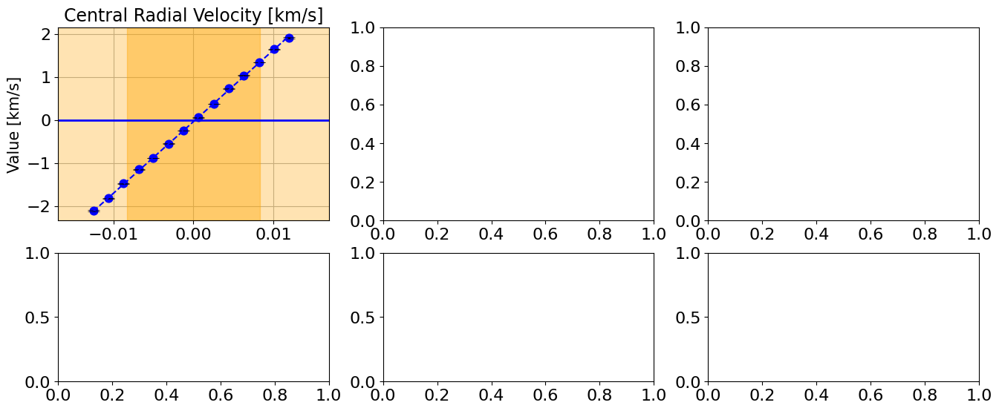

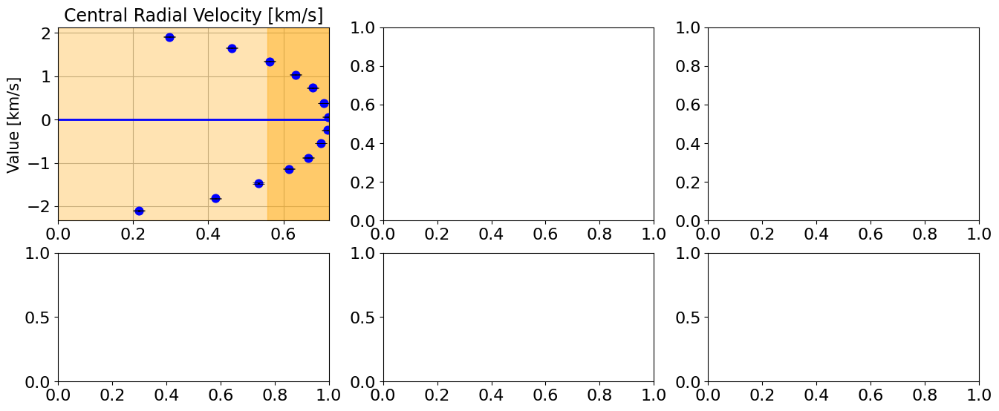

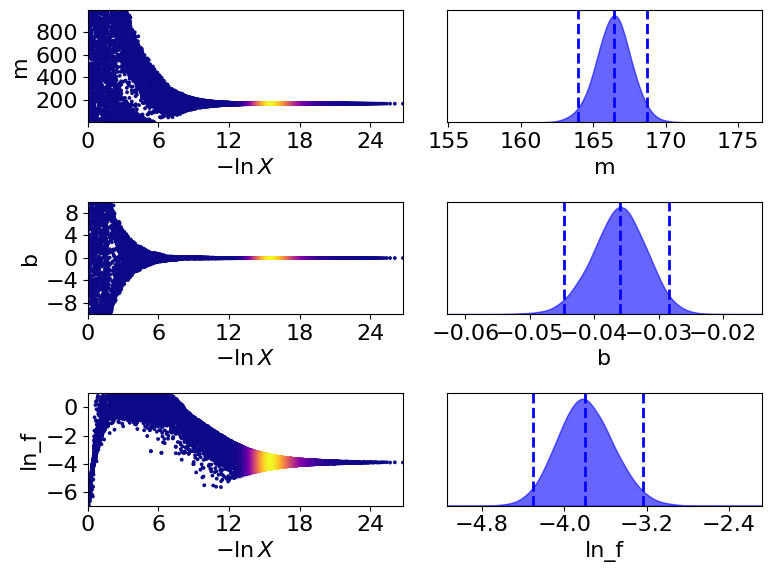

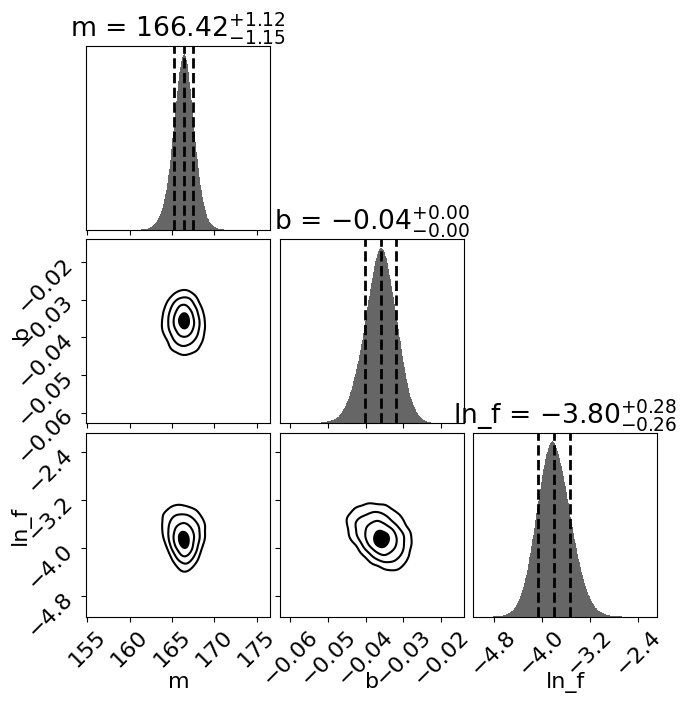

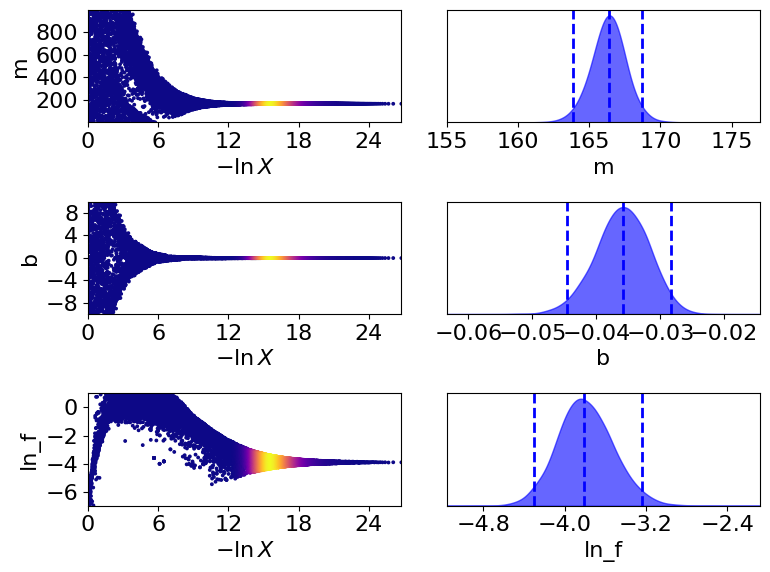

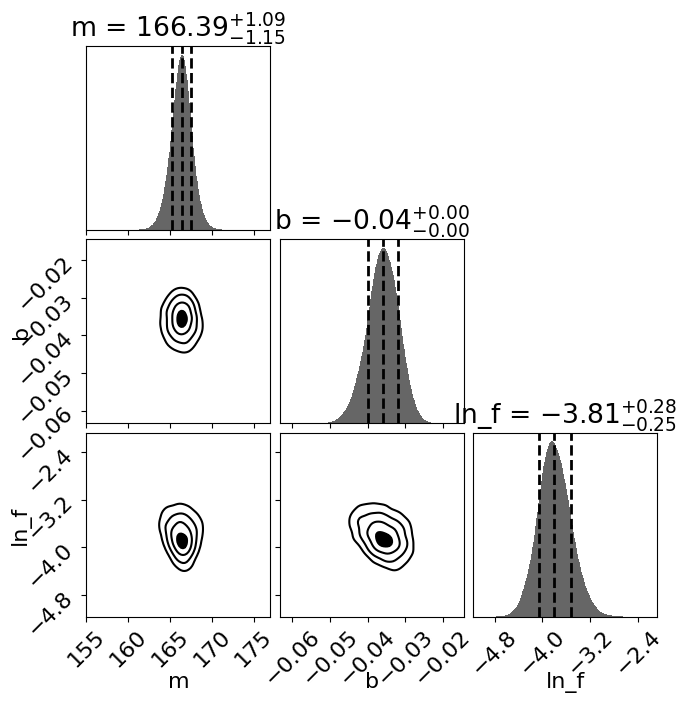

In [12]:
hecate.plot_local_params(indices_final, local_params, master_params, linear_fit=True, plot_nested=True, save=None)

# Weak Fe I lines

In [16]:
spectra, time, airmass, berv, bervmax, snr, list_spectra = get_spectra()
CCFs, _, _, _, _, _, _ = get_CCFs(planet_params, plot=False)

In [17]:
mask = np.array([4551.6499, 5539.2824, 6165.3641,
4593.5268, 5552.6919, 6226.7403, 4657.5879, 5568.8689, 6311.5050,
4658.2976, 5607.6668, 6315.8164, 4672.8364, 5611.3587, 6380.7483,
4726.1396, 5618.6360, 6385.7206, 4785.9583, 5635.8247, 6392.5429,
4794.3571, 5636.6992, 6436.4102, 4799.4092, 5646.6854, 6496.4738,
4802.5216, 5651.4716, 6574.2325, 4808.1509, 5652.3194, 6581.2143,
4809.9400, 5661.3480, 6608.0301, 5213.8071, 5677.6875, 6627.5488,
5223.1851, 5680.2441, 6646.9355, 5236.2039, 5720.8950, 6703.5720,
5293.9609, 5793.9178, 6710.3213, 5294.5493, 5807.7868, 6737.9830,
5358.1168, 5811.9172, 6739.5243, 5386.3345, 5814.8092, 6745.9626,
5395.2187, 5827.8794, 6746.9508, 5417.0405, 5835.1018, 6752.7107,
5460.8762, 5852.2222, 6793.2656, 5461.5530, 5858.7840, 6806.8491,
5464.2825, 5861.1123, 6820.3730, 5470.0957, 5881.2822, 6828.5976,
5487.1489, 5902.4755, 6839.8340, 5491.8346, 5929.6802, 6841.3450,
5493.5012, 6034.0365, 6843.6606, 5522.4491, 6082.7147])

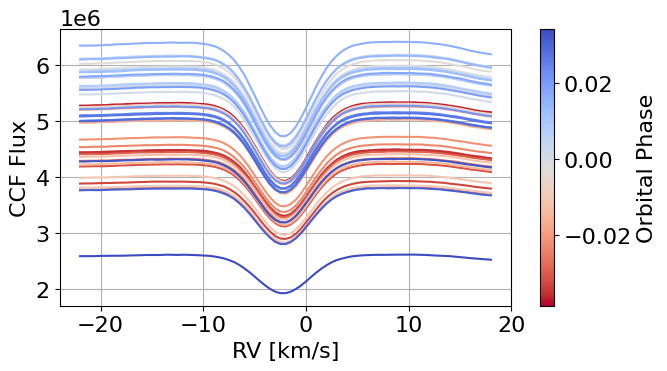

In [18]:
RV_reference = CCFs[0,2,:] #same as in white light CCF

CCFs_weak_iron = build_CCF(time, planet_params, spectra, RV_reference, mask, berv, bervmax, plot=True).CCFs

In [19]:
hecate = HECATE(planet_params, stellar_params, time, CCFs_weak_iron)

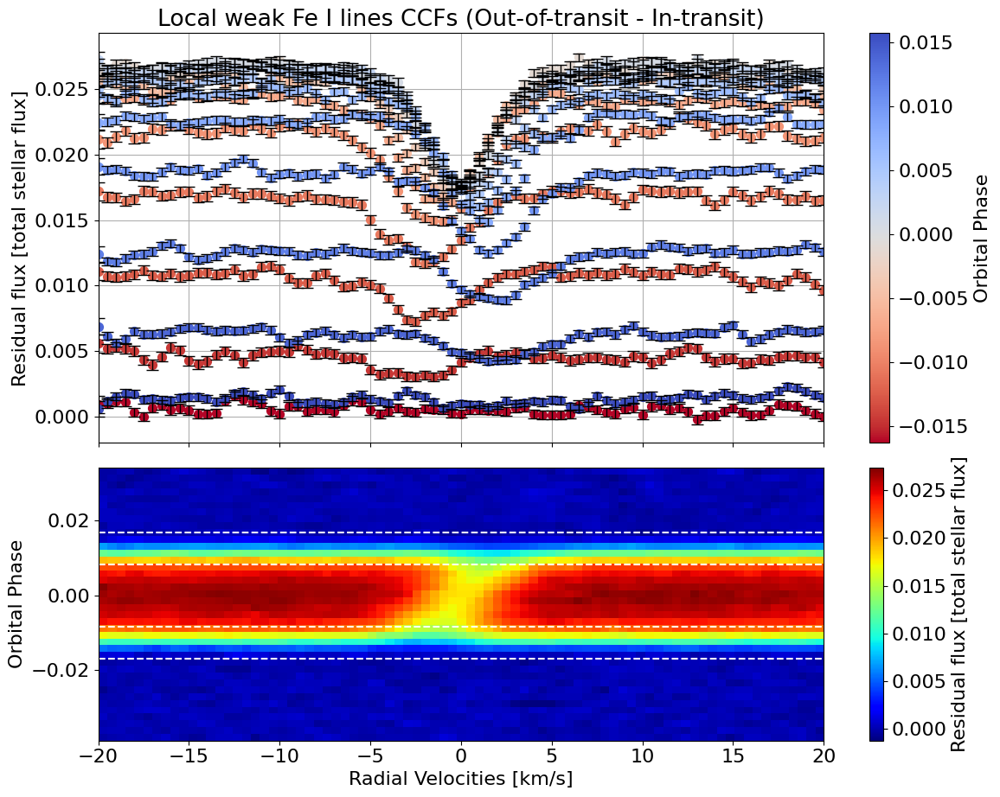

In [23]:
ccf_type = "weak Fe I lines"
model_fit = "modified Gaussian"
plot = {"SOAP":False, "fits_initial_CCF":False, "sys_vel":False, "avg_out_of_transit_CCF":False, "local_CCFs":True}

local_CCFs, CCFs_sub_all, CCFs_flux_corr, phases, in_phases = hecate._extract_local_CCF(model_fit, ccf_type, plot, save=None)

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.014
------------------------------
Fit parameters:
y0 = 0.004642 ± 0.000045
x0 = -2.688010 ± 0.136068
sigma = 2.377540 ± 0.182298
a = 0.001486 ± 0.000144
c = 7.184655 ± 3.999232
R^2:  0.6463
------------------------------
CCF parameters:
Central RV [km/s]: -2.688010 ± 0.136068
Continuum: 0.004642 ± 0.000045
Deph [%]: 67.975256 ± 3.115333
Width [km/s]: 2.377540 ± 0.182298


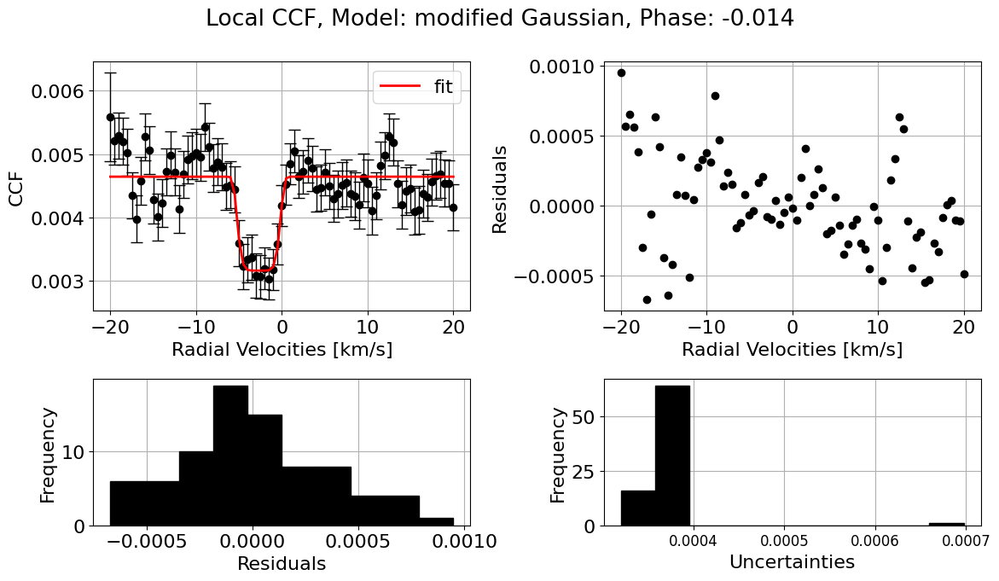

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.012
------------------------------
Fit parameters:
y0 = 0.010813 ± 0.000047
x0 = -1.916942 ± 0.099723
sigma = 2.101904 ± 0.173888
a = 0.003287 ± 0.000194
c = 2.444546 ± 0.440570
R^2:  0.8554
------------------------------
CCF parameters:
Central RV [km/s]: -1.916942 ± 0.099723
Continuum: 0.010813 ± 0.000047
Deph [%]: 69.598284 ± 1.795133
Width [km/s]: 2.101904 ± 0.173888


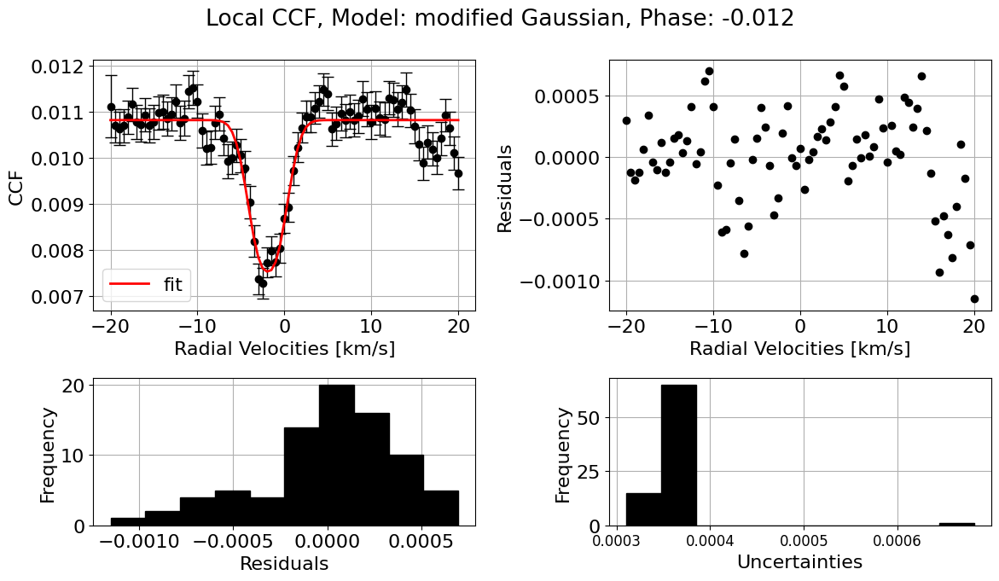

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.010
------------------------------
Fit parameters:
y0 = 0.016889 ± 0.000050
x0 = -1.931297 ± 0.071642
sigma = 2.098553 ± 0.132414
a = 0.005070 ± 0.000212
c = 2.125649 ± 0.247581
R^2:  0.958
------------------------------
CCF parameters:
Central RV [km/s]: -1.931297 ± 0.071642
Continuum: 0.016889 ± 0.000050
Deph [%]: 69.979051 ± 1.256060
Width [km/s]: 2.098553 ± 0.132414


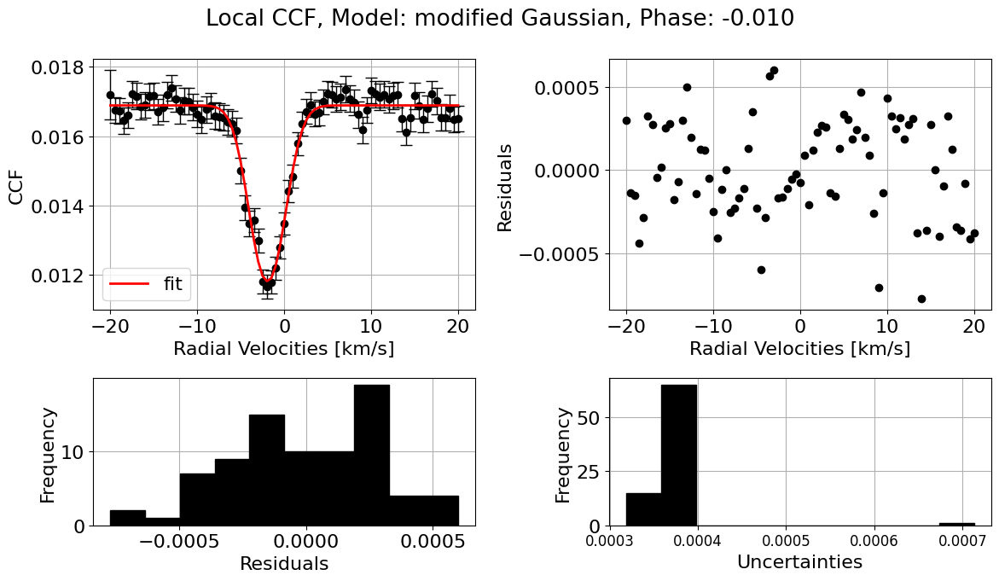

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.008
------------------------------
Fit parameters:
y0 = 0.021805 ± 0.000051
x0 = -1.437037 ± 0.054018
sigma = 2.210982 ± 0.098452
a = 0.006983 ± 0.000205
c = 2.153569 ± 0.181166
R^2:  0.9638
------------------------------
CCF parameters:
Central RV [km/s]: -1.437037 ± 0.054018
Continuum: 0.021805 ± 0.000051
Deph [%]: 67.975457 ± 0.944960
Width [km/s]: 2.210982 ± 0.098452


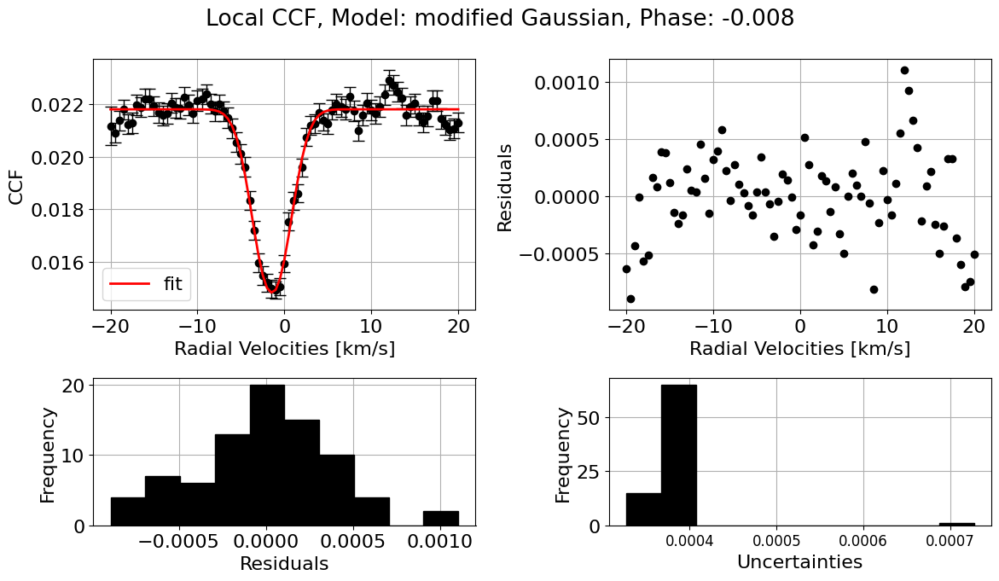

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.006
------------------------------
Fit parameters:
y0 = 0.024137 ± 0.000044
x0 = -1.219873 ± 0.040555
sigma = 2.049621 ± 0.076349
a = 0.007903 ± 0.000187
c = 2.013159 ± 0.130573
R^2:  0.9825
------------------------------
CCF parameters:
Central RV [km/s]: -1.219873 ± 0.040555
Continuum: 0.024137 ± 0.000044
Deph [%]: 67.256442 ± 0.776060
Width [km/s]: 2.049621 ± 0.076349


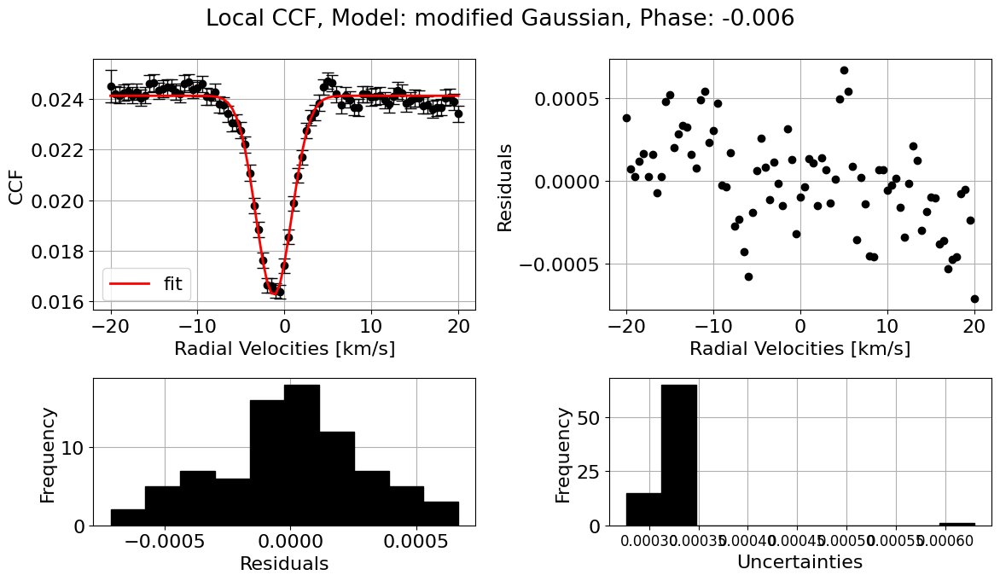

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.004
------------------------------
Fit parameters:
y0 = 0.025484 ± 0.000041
x0 = -0.936420 ± 0.035092
sigma = 2.140838 ± 0.061942
a = 0.008376 ± 0.000166
c = 2.308327 ± 0.137403
R^2:  0.9786
------------------------------
CCF parameters:
Central RV [km/s]: -0.936420 ± 0.035092
Continuum: 0.025484 ± 0.000041
Deph [%]: 67.131738 ± 0.653150
Width [km/s]: 2.140838 ± 0.061942


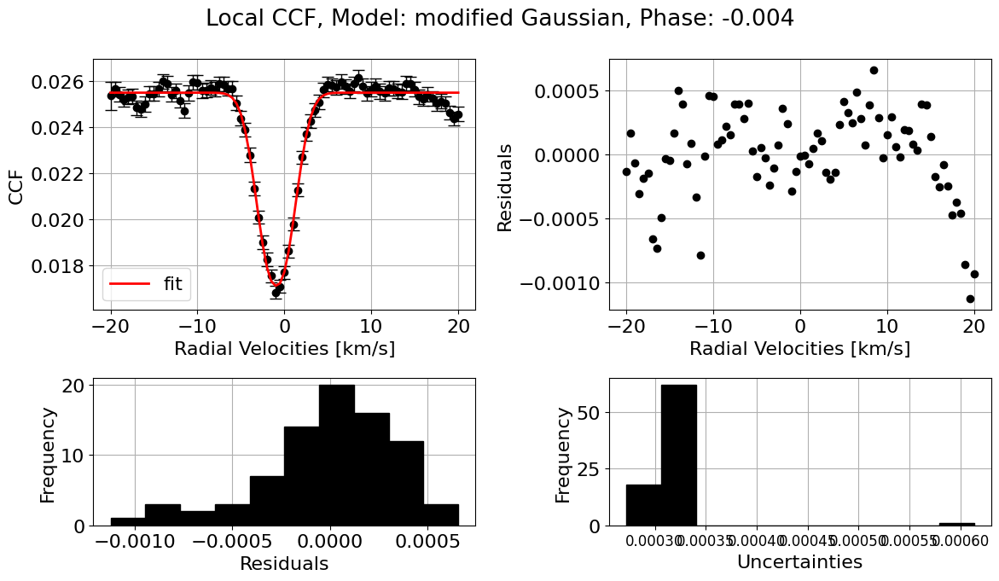

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.003
------------------------------
Fit parameters:
y0 = 0.026037 ± 0.000042
x0 = -0.527742 ± 0.035349
sigma = 1.990781 ± 0.070233
a = 0.008818 ± 0.000183
c = 1.765043 ± 0.092742
R^2:  0.9846
------------------------------
CCF parameters:
Central RV [km/s]: -0.527742 ± 0.035349
Continuum: 0.026037 ± 0.000042
Deph [%]: 66.132253 ± 0.706784
Width [km/s]: 1.990781 ± 0.070233


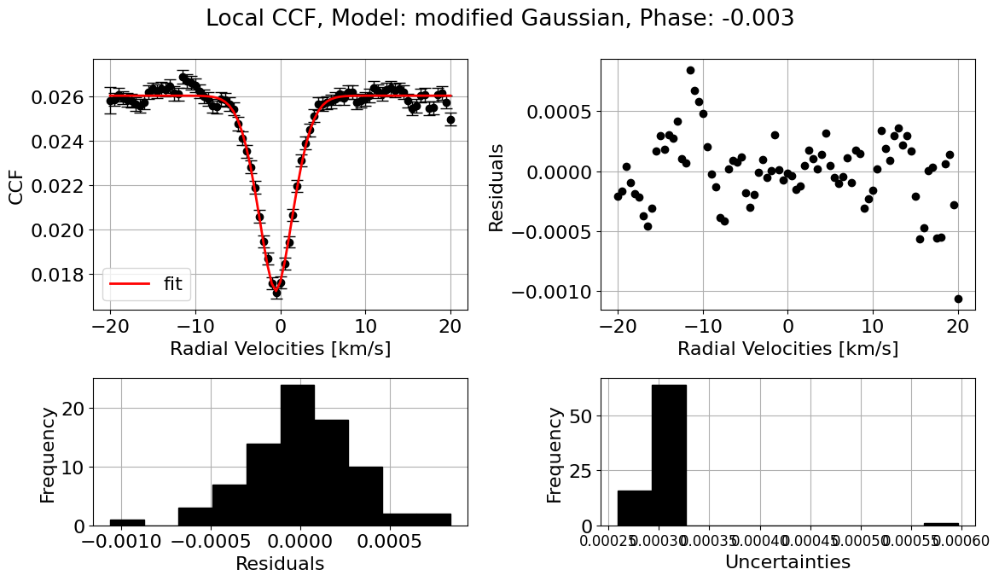

##############################
FITTING modified Gaussian model TO local CCF
Phase: -0.001
------------------------------
Fit parameters:
y0 = 0.026667 ± 0.000041
x0 = -0.295942 ± 0.032091
sigma = 1.932633 ± 0.061736
a = 0.009163 ± 0.000181
c = 1.937772 ± 0.103022
R^2:  0.9882
------------------------------
CCF parameters:
Central RV [km/s]: -0.295942 ± 0.032091
Continuum: 0.026667 ± 0.000041
Deph [%]: 65.640599 ± 0.682603
Width [km/s]: 1.932633 ± 0.061736


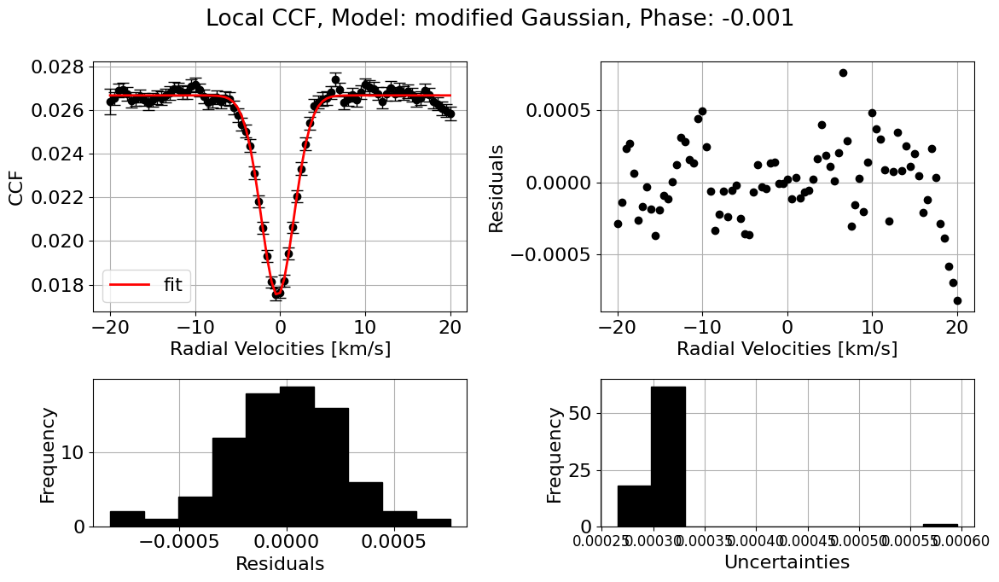

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0006
------------------------------
Fit parameters:
y0 = 0.026693 ± 0.000042
x0 = -0.044893 ± 0.032683
sigma = 1.947026 ± 0.060952
a = 0.009135 ± 0.000181
c = 2.027314 ± 0.111576
R^2:  0.982
------------------------------
CCF parameters:
Central RV [km/s]: -0.044893 ± 0.032683
Continuum: 0.026693 ± 0.000042
Deph [%]: 65.779045 ± 0.680549
Width [km/s]: 1.947026 ± 0.060952


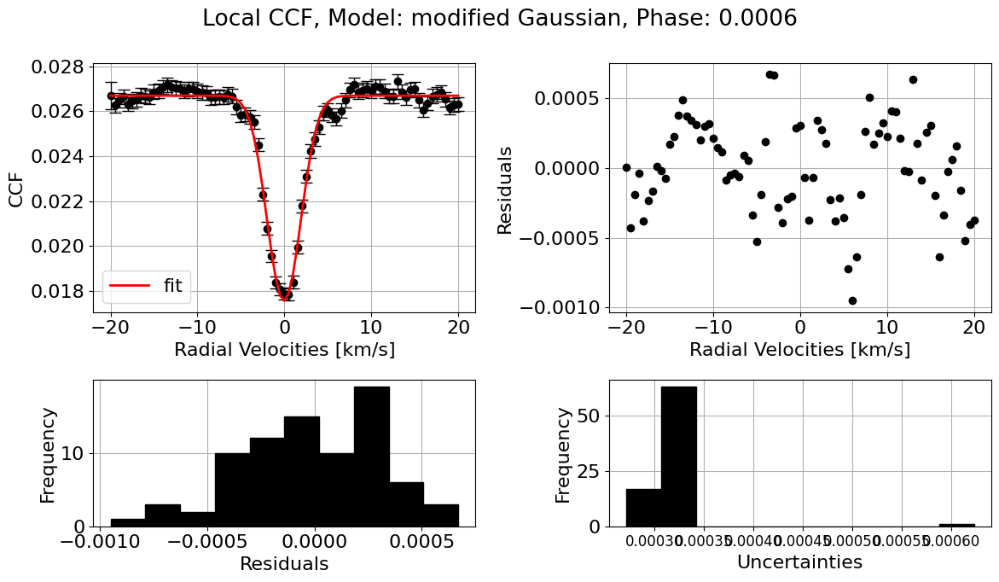

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0025
------------------------------
Fit parameters:
y0 = 0.026402 ± 0.000042
x0 = 0.416549 ± 0.034388
sigma = 1.979559 ± 0.066360
a = 0.008940 ± 0.000184
c = 1.896162 ± 0.103064
R^2:  0.9905
------------------------------
CCF parameters:
Central RV [km/s]: 0.416549 ± 0.034388
Continuum: 0.026402 ± 0.000042
Deph [%]: 66.139098 ± 0.697438
Width [km/s]: 1.979559 ± 0.066360


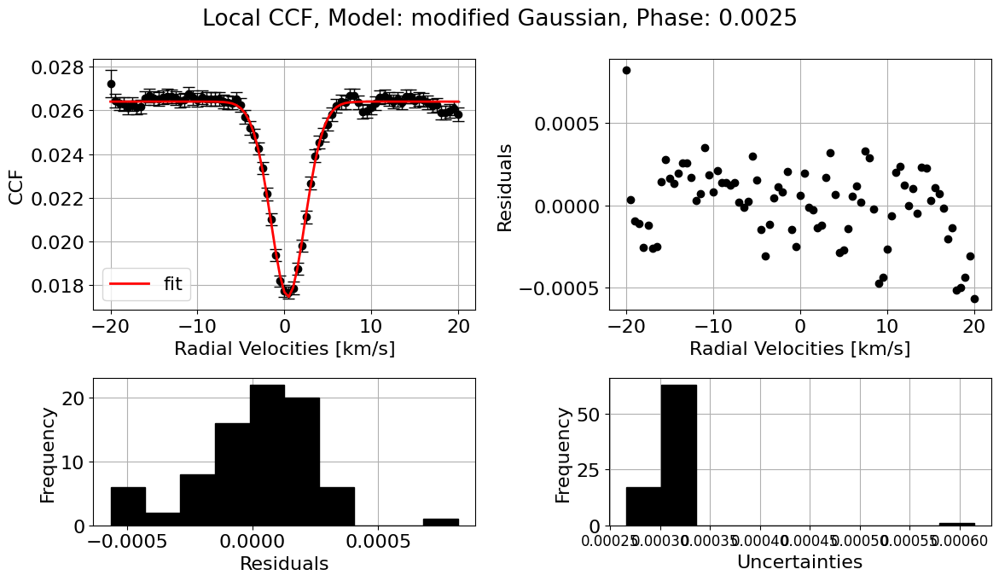

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0044
------------------------------
Fit parameters:
y0 = 0.025644 ± 0.000040
x0 = 0.663918 ± 0.033146
sigma = 2.066001 ± 0.061366
a = 0.008721 ± 0.000167
c = 2.077276 ± 0.111717
R^2:  0.9901
------------------------------
CCF parameters:
Central RV [km/s]: 0.663918 ± 0.033146
Continuum: 0.025644 ± 0.000040
Deph [%]: 65.992662 ± 0.654674
Width [km/s]: 2.066001 ± 0.061366


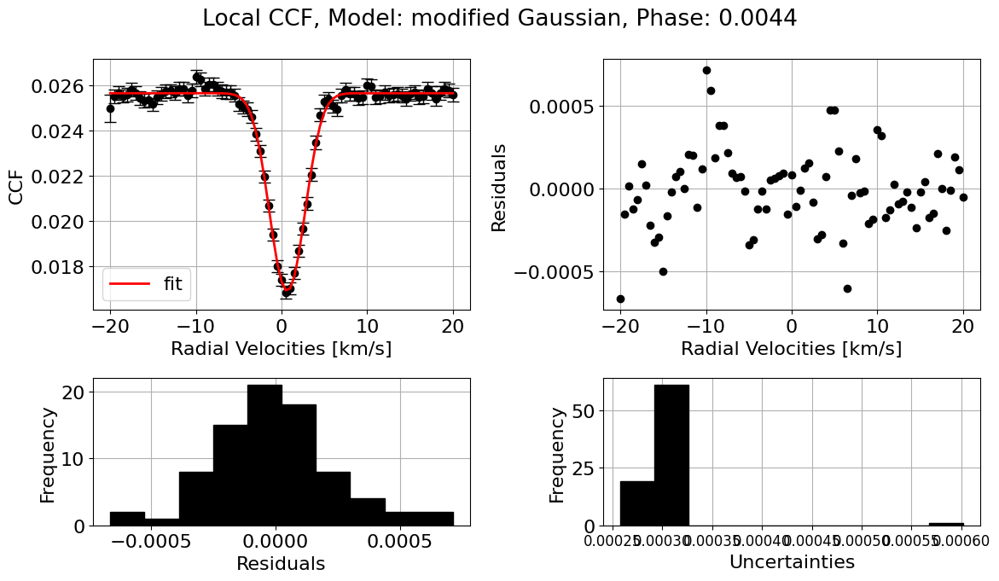

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0062
------------------------------
Fit parameters:
y0 = 0.024574 ± 0.000041
x0 = 1.071685 ± 0.035179
sigma = 1.921163 ± 0.068301
a = 0.008561 ± 0.000186
c = 1.882653 ± 0.106703
R^2:  0.9862
------------------------------
CCF parameters:
Central RV [km/s]: 1.071685 ± 0.035179
Continuum: 0.024574 ± 0.000041
Deph [%]: 65.160224 ± 0.757577
Width [km/s]: 1.921163 ± 0.068301


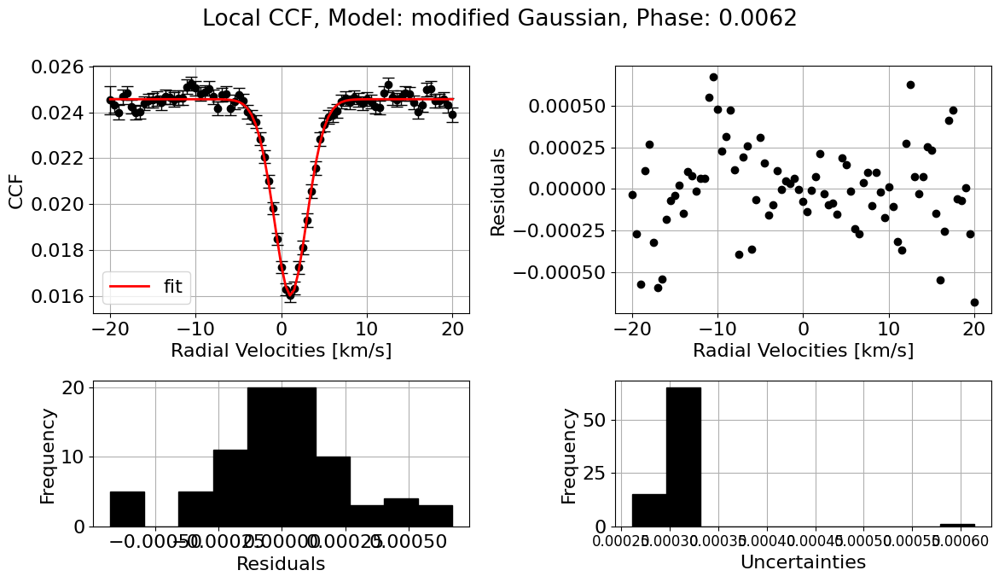

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0081
------------------------------
Fit parameters:
y0 = 0.022714 ± 0.000041
x0 = 1.249170 ± 0.038656
sigma = 1.980993 ± 0.072437
a = 0.007702 ± 0.000180
c = 2.039544 ± 0.131465
R^2:  0.9768
------------------------------
CCF parameters:
Central RV [km/s]: 1.249170 ± 0.038656
Continuum: 0.022714 ± 0.000041
Deph [%]: 66.089106 ± 0.794478
Width [km/s]: 1.980993 ± 0.072437


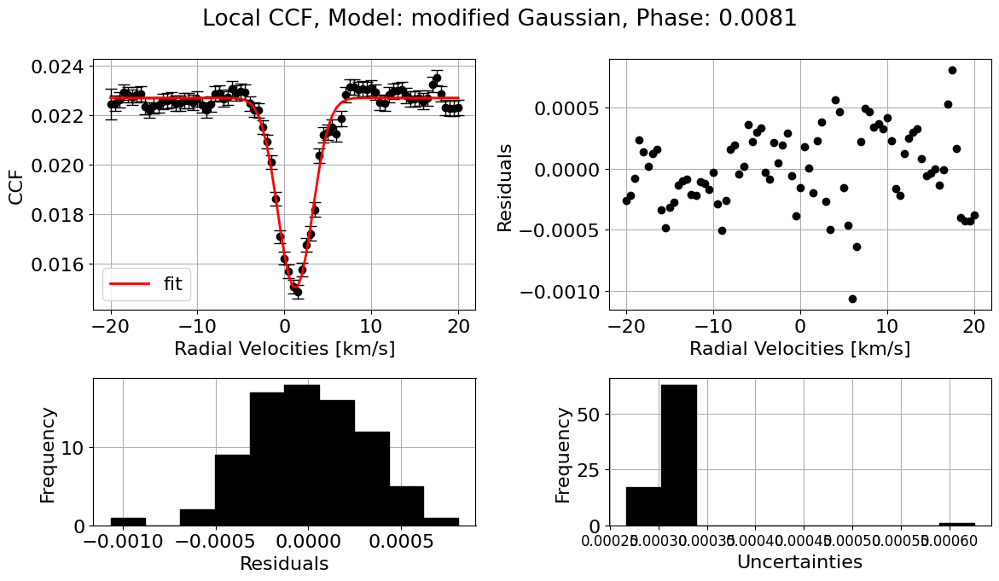

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0100
------------------------------
Fit parameters:
y0 = 0.018686 ± 0.000041
x0 = 1.642217 ± 0.049344
sigma = 1.979571 ± 0.097574
a = 0.006232 ± 0.000186
c = 1.839122 ± 0.140815
R^2:  0.9727
------------------------------
CCF parameters:
Central RV [km/s]: 1.642217 ± 0.049344
Continuum: 0.018686 ± 0.000041
Deph [%]: 66.651594 ± 0.999148
Width [km/s]: 1.979571 ± 0.097574


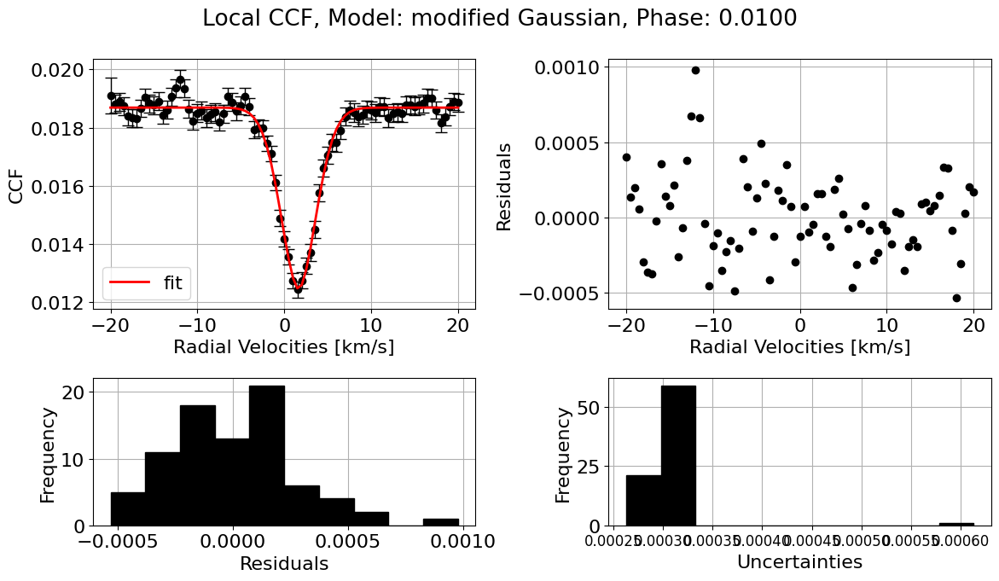

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0119
------------------------------
Fit parameters:
y0 = 0.012569 ± 0.000040
x0 = 1.940076 ± 0.078009
sigma = 2.417944 ± 0.128659
a = 0.003541 ± 0.000146
c = 2.831523 ± 0.392122
R^2:  0.9328
------------------------------
CCF parameters:
Central RV [km/s]: 1.940076 ± 0.078009
Continuum: 0.012569 ± 0.000040
Deph [%]: 71.829166 ± 1.167891
Width [km/s]: 2.417944 ± 0.128659


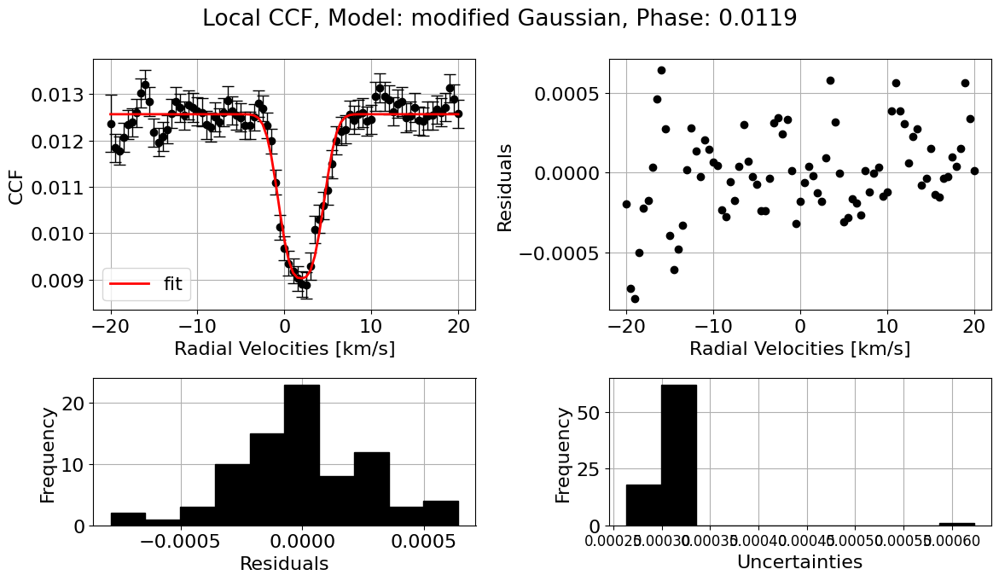

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0138
------------------------------
Fit parameters:
y0 = 0.006387 ± 0.000040
x0 = 1.943652 ± 0.143358
sigma = 2.422002 ± 0.250258
a = 0.002071 ± 0.000153
c = 2.424454 ± 0.543374
R^2:  0.8328
------------------------------
CCF parameters:
Central RV [km/s]: 1.943652 ± 0.143358
Continuum: 0.006387 ± 0.000040
Deph [%]: 67.573489 ± 2.398203
Width [km/s]: 2.422002 ± 0.250258


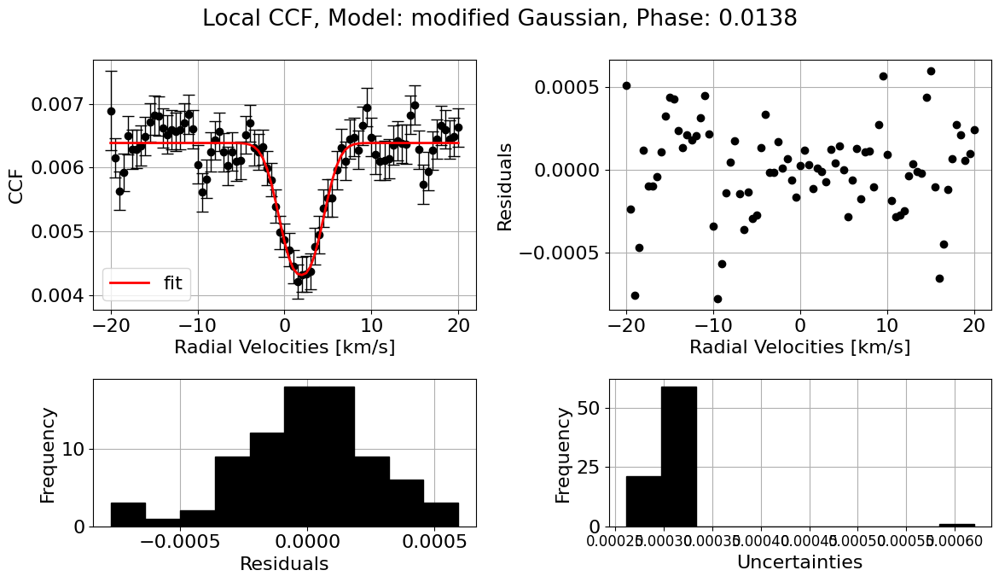

##############################
FITTING modified Gaussian model TO local CCF
Phase: 0.0157
------------------------------
Fit parameters:
y0 = 0.001575 ± 0.000083
x0 = 2.265385 ± 0.817668
sigma = 4.711206 ± 1.689052
a = 0.000625 ± 0.000170
c = 1.664762 ± 0.989774
R^2:  0.2939
------------------------------
CCF parameters:
Central RV [km/s]: 2.265385 ± 0.817668
Continuum: 0.001575 ± 0.000083
Deph [%]: 60.315066 ± 10.984469
Width [km/s]: 4.711206 ± 1.689052


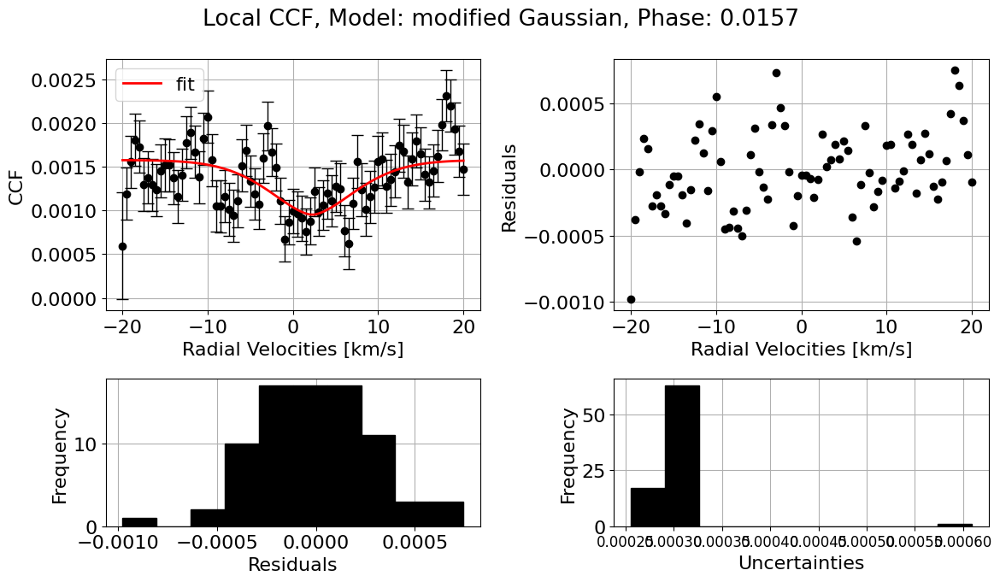

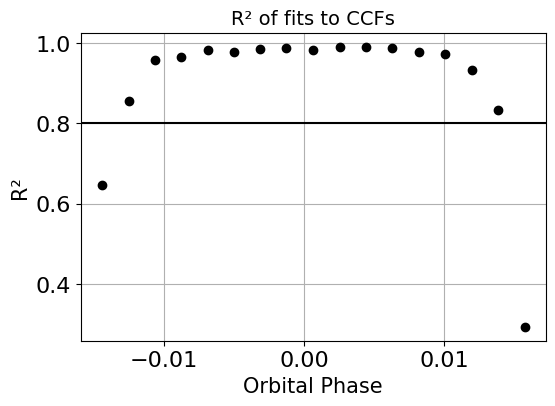

In [24]:
central_rv_array, continuum_array, depth_array, width_array, R2_array = hecate._CCF_parameters(CCFs=local_CCFs, ccf_type="local", model="modified Gaussian", print_output=True, plot_fit=True, save=None)

In [25]:
phase_mu = get_phase_mu(planet_params, time)
phases, tr_dur, tr_ingress_egress, in_indices, out_indices = phase_mu.phases, phase_mu.tr_dur, phase_mu.tr_ingress_egress, phase_mu.in_indices, phase_mu.out_indices
in_phases = phases[np.isin(np.arange(len(phases)), in_indices)]

mu_in = get_phase_mu.mu(in_phases, planet_params)
indices_final = np.arange(2,len(mu_in)-2) 

mu_min = get_phase_mu.mu(tr_dur/2-tr_ingress_egress/2, planet_params)
mu_max = get_phase_mu.mu(0, planet_params)

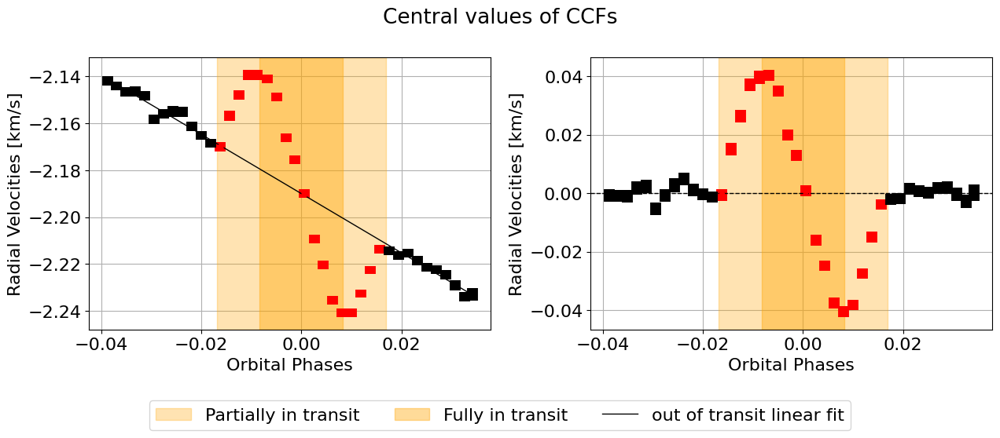

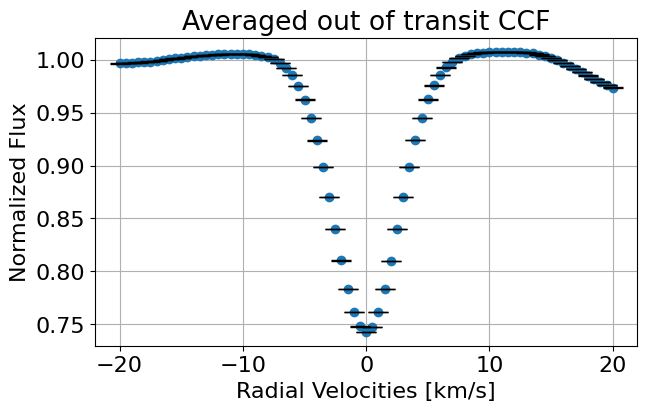

##############################
FITTING modified Gaussian model TO master CCF
------------------------------
Fit parameters:
y0 = 1.000218 ± 0.000011
x0 = -0.000251 ± 0.000324
sigma = 2.593007 ± 0.000596
a = 0.255834 ± 0.000038
c = 2.063494 ± 0.000862
R^2:  0.9925
------------------------------
CCF parameters:
Central RV [km/s]: -0.000251 ± 0.000324
Continuum: 1.000218 ± 0.000011
Deph [%]: 74.422185 ± 0.003822
Width [km/s]: 2.593007 ± 0.000596


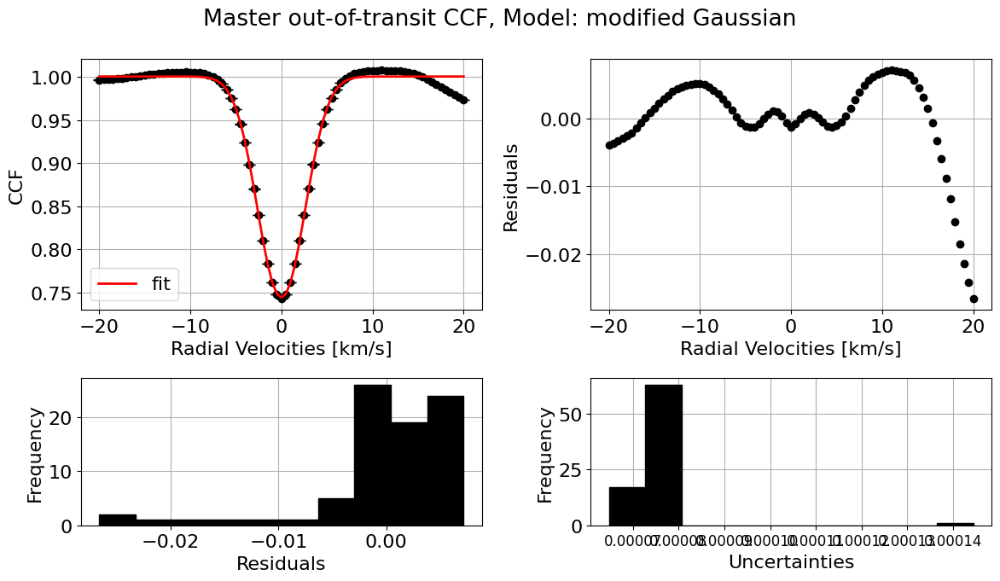

In [27]:
sysvel_corr = sysvel_correction(planet_params, time, CCFs_weak_iron, model="modified Gaussian", plot_fits=False, plot_sys_vel=True)
CCFs_sysvel_corr = sysvel_corr.CCFs_sysvel_corr

RV_reference = np.arange(round(np.max(CCFs_sysvel_corr[:,2,0])), round(np.min(CCFs_sysvel_corr[:,2,-1]))+0.5, 0.5)

CCF_interp, avg_out_of_transit_CCF = hecate._avg_out_of_transit_CCF(CCFs_sysvel_corr, RV_reference, plot=True, save=None)

master_central_rv_array, master_continuum_array, master_depth_array, master_width_array, master_R2_array = hecate._CCF_parameters(CCFs=avg_out_of_transit_CCF, ccf_type="master", model="modified Gaussian", print_output=True, plot_fit=True, save=None)

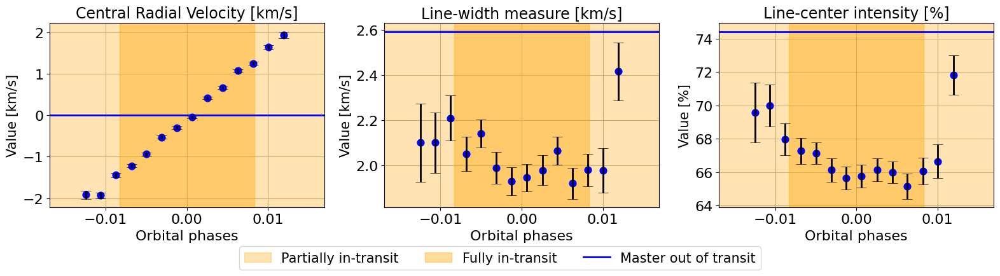

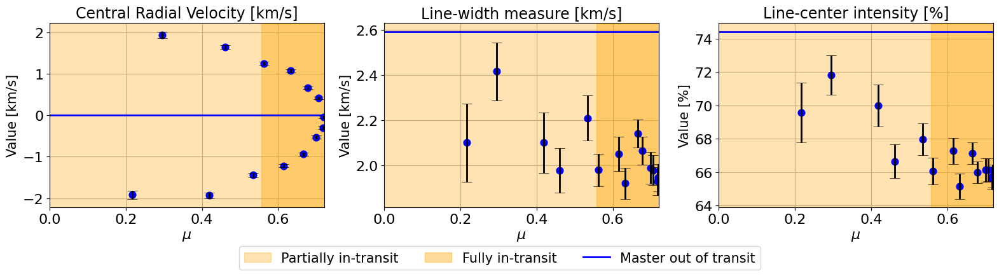

In [34]:
local_params = [central_rv_array, width_array, depth_array]
master_params = [master_central_rv_array, master_width_array, master_depth_array]

hecate._plot_local_params(indices_final, local_params, master_params, linear_fit=False, plot_nested=False, save=None)

Central Radial Velocity [km/s]
------------------------------
Orbital phases


18168it [00:14, 1216.64it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 372264 | eff(%):  4.740 | loglstar: 23.289 < 28.896 < 28.275 | logz: 15.295 +/-  0.098 | stop:  0.871]             
14315it [00:09, 1433.27it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 272246 | eff(%):  5.063 | loglstar: -16.399 < -10.712 < -11.388 | logz: -17.687 +/-  0.067 | stop:  0.929]        


------------------------------
Linear vs Constant
logZ(linear)   = 15.297 ± 0.089
logZ(constant) = -17.722 ± 0.062
log Bayes factor = 33.019
Unconstrained model favored.
------------------------------


17972it [00:13, 1338.97it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 367670 | eff(%):  4.746 | loglstar: 23.242 < 28.901 < 28.301 | logz: 15.723 +/-  0.096 | stop:  0.871]           
14781it [00:09, 1512.05it/s, batch: 5 | bound: 5 | nc: 1 | ncall: 294846 | eff(%):  4.833 | loglstar: -16.056 < -9.178 < -10.660 | logz: -20.442 +/-  0.100 | stop:  0.973]          


Positive vs Negative slope
logZ(m>0)  = 15.739 ± 0.088
logZ(m<0)  = -20.404 ± 0.087
log Bayes factor = -36.143
Positive slope favored.
Linear fit parameters:
m = 167.152810 +/- 2.736859
b = -0.067100 +/- 0.014433
ln_f = -3.246546 +/- 0.890555
------------------------------
------------------------------
mu


18532it [00:13, 1381.30it/s, batch: 6 | bound: 4 | nc: 1 | ncall: 378842 | eff(%):  4.754 | loglstar: -13.101 < -6.715 < -7.936 | logz: -20.927 +/-  0.101 | stop:  0.830]          
15575it [00:10, 1556.68it/s, batch: 7 | bound: 5 | nc: 1 | ncall: 299420 | eff(%):  5.025 | loglstar: -16.211 < -10.713 < -11.370 | logz: -19.923 +/-  0.078 | stop:  0.918]         


------------------------------
Linear vs Constant
logZ(linear)   = -20.877 ± 0.093
logZ(constant) = -19.935 ± 0.072
log Bayes factor = -0.942
Zero-slope model favored
Linear fit parameters:
b = -0.550434 +/- 0.700921
ln_f = 0.769121 +/- 0.205874
------------------------------
Line-width measure [km/s]
------------------------------
Orbital phases


16738it [00:11, 1407.27it/s, batch: 7 | bound: 3 | nc: 1 | ncall: 339428 | eff(%):  4.776 | loglstar: 18.590 < 23.546 < 22.912 | logz: 11.049 +/-  0.093 | stop:  0.963]           
16737it [00:11, 1453.96it/s, batch: 9 | bound: 3 | nc: 1 | ncall: 324825 | eff(%):  4.991 | loglstar: 18.335 < 23.241 < 22.644 | logz: 13.789 +/-  0.072 | stop:  0.876]           


------------------------------
Linear vs Constant
logZ(linear)   = 11.083 ± 0.086
logZ(constant) = 13.792 ± 0.068
log Bayes factor = -2.710
Zero-slope model favored
Linear fit parameters:
b = 2.028149 +/- 0.024551
ln_f = -4.081964 +/- 1.331440
------------------------------
------------------------------
mu


18410it [00:15, 1210.48it/s, batch: 7 | bound: 3 | nc: 1 | ncall: 377554 | eff(%):  4.738 | loglstar: 21.527 < 26.256 < 25.446 | logz: 11.382 +/-  0.098 | stop:  0.923]           
15055it [00:09, 1543.16it/s, batch: 8 | bound: 2 | nc: 1 | ncall: 288089 | eff(%):  5.042 | loglstar: 18.684 < 23.237 < 22.433 | logz: 13.985 +/-  0.077 | stop:  0.988]           


------------------------------
Linear vs Constant
logZ(linear)   = 11.372 ± 0.093
logZ(constant) = 13.976 ± 0.073
log Bayes factor = -2.605
Zero-slope model favored
Linear fit parameters:
b = 2.027902 +/- 0.025016
ln_f = -4.090937 +/- 1.358737
------------------------------
Line-center intensity [%]
------------------------------
Orbital phases


14742it [00:10, 1468.31it/s, batch: 7 | bound: 6 | nc: 1 | ncall: 292827 | eff(%):  4.852 | loglstar: -19.934 < -14.534 < -14.896 | logz: -22.462 +/-  0.075 | stop:  0.945]        
15875it [00:10, 1469.67it/s, batch: 8 | bound: 3 | nc: 1 | ncall: 306208 | eff(%):  5.013 | loglstar: -20.221 < -14.798 < -15.169 | logz: -22.324 +/-  0.066 | stop:  0.857]        


------------------------------
Linear vs Constant
logZ(linear)   = -22.490 ± 0.067
logZ(constant) = -22.309 ± 0.062
log Bayes factor = -0.181
Zero-slope model favored
Linear fit parameters:
b = 66.941800 +/- 0.444837
ln_f = -3.896737 +/- 0.356516
------------------------------
------------------------------
mu


15906it [00:12, 1298.78it/s, batch: 7 | bound: 3 | nc: 1 | ncall: 319623 | eff(%):  4.811 | loglstar: -10.198 < -5.469 < -5.987 | logz: -16.480 +/-  0.086 | stop:  0.976]           
16384it [00:11, 1428.32it/s, batch: 8 | bound: 5 | nc: 1 | ncall: 317173 | eff(%):  5.000 | loglstar: -20.314 < -14.797 < -15.074 | logz: -22.319 +/-  0.065 | stop:  0.832]        


------------------------------
Linear vs Constant
logZ(linear)   = -16.478 ± 0.080
logZ(constant) = -22.358 ± 0.060
log Bayes factor = 5.880
Unconstrained model favored.
------------------------------


17038it [00:11, 1450.23it/s, batch: 6 | bound: 5 | nc: 1 | ncall: 346616 | eff(%):  4.764 | loglstar: -20.901 < -14.850 < -16.088 | logz: -26.706 +/-  0.091 | stop:  0.857]         
15463it [00:10, 1508.33it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 309509 | eff(%):  4.825 | loglstar: -10.317 < -5.468 < -5.703 | logz: -15.500 +/-  0.086 | stop:  0.982]           


Positive vs Negative slope
logZ(m>0)  = -26.727 ± 0.085
logZ(m<0)  = -15.505 ± 0.076
log Bayes factor = 11.222
Negative slope favored.
Linear fit parameters:
m = -10.069783 +/- 1.982163
b = 72.936853 +/- 1.278268
ln_f = -5.693198 +/- 0.900906
------------------------------


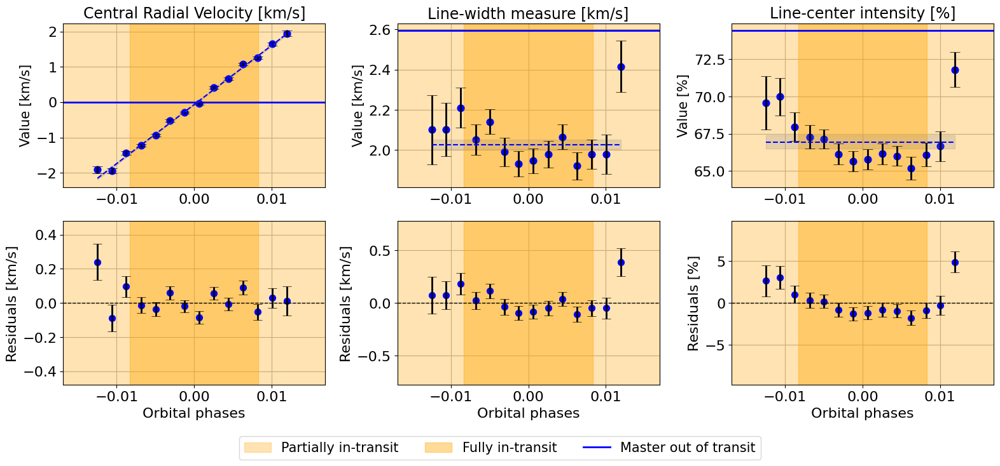

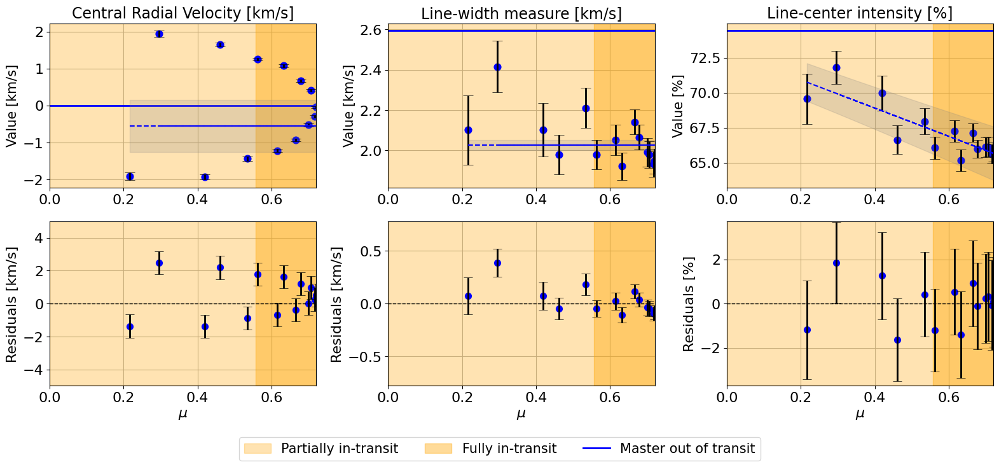

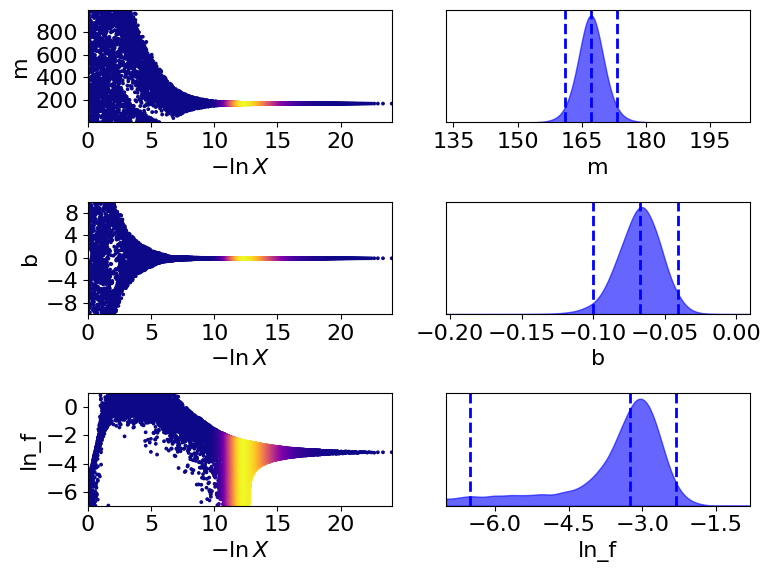

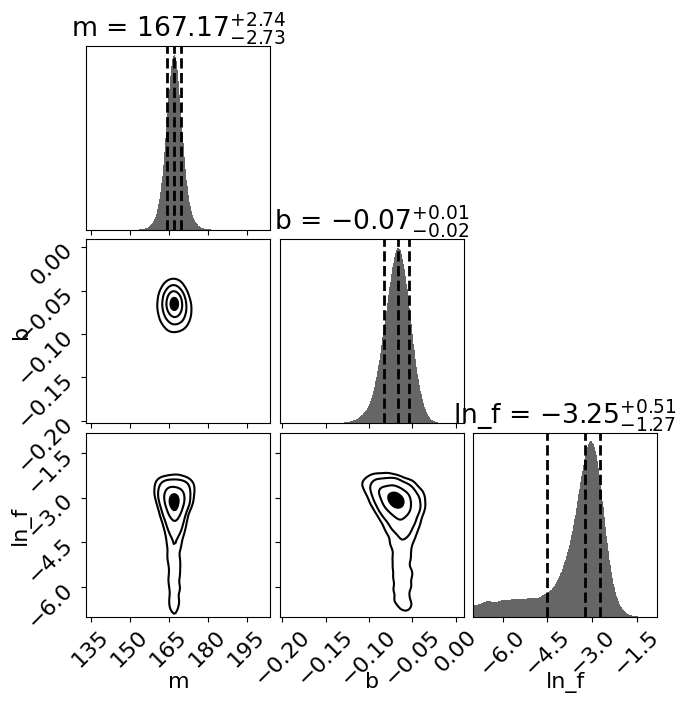

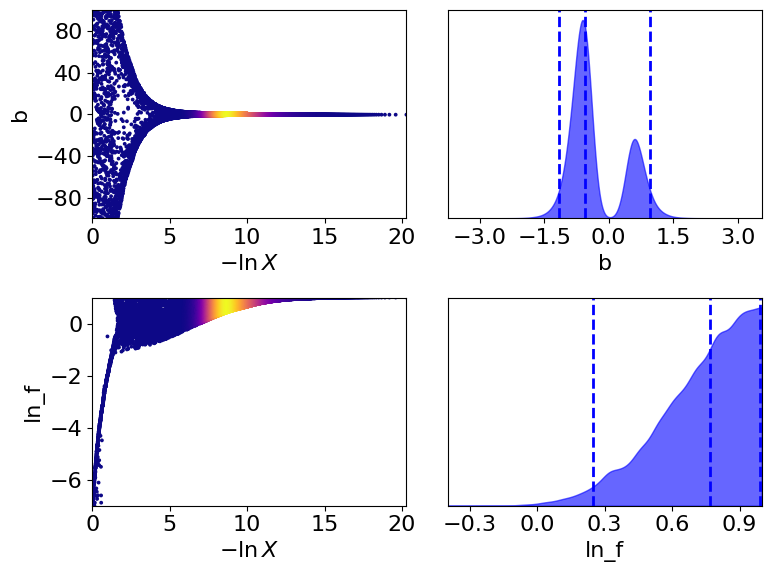

...

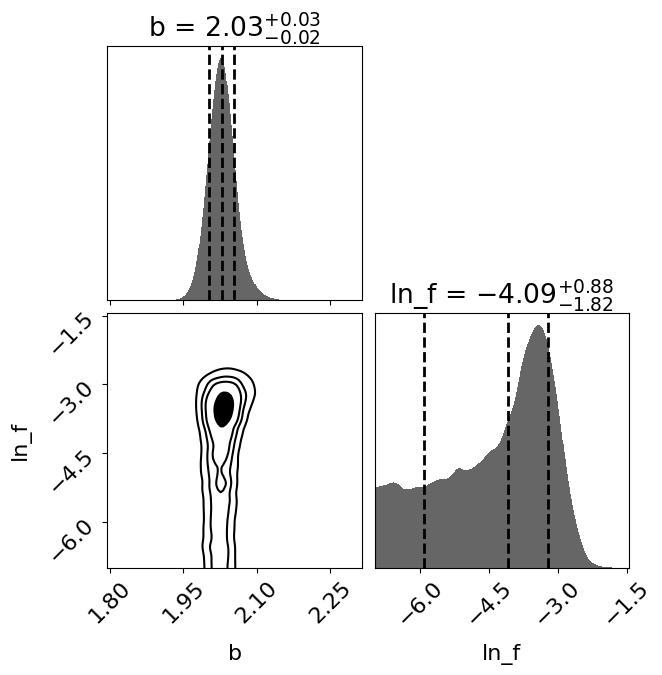

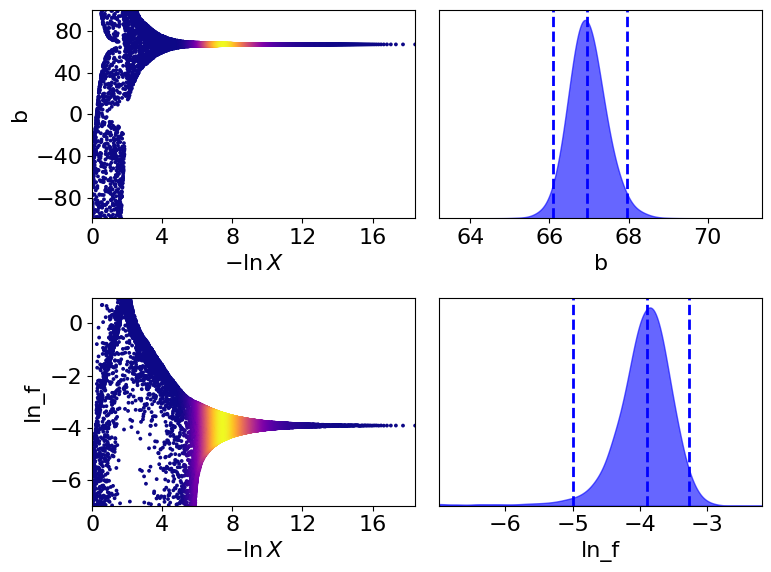

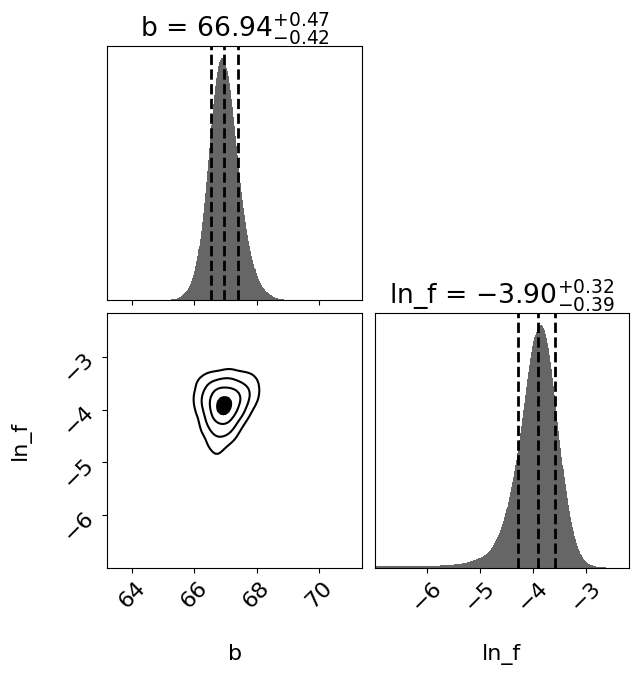

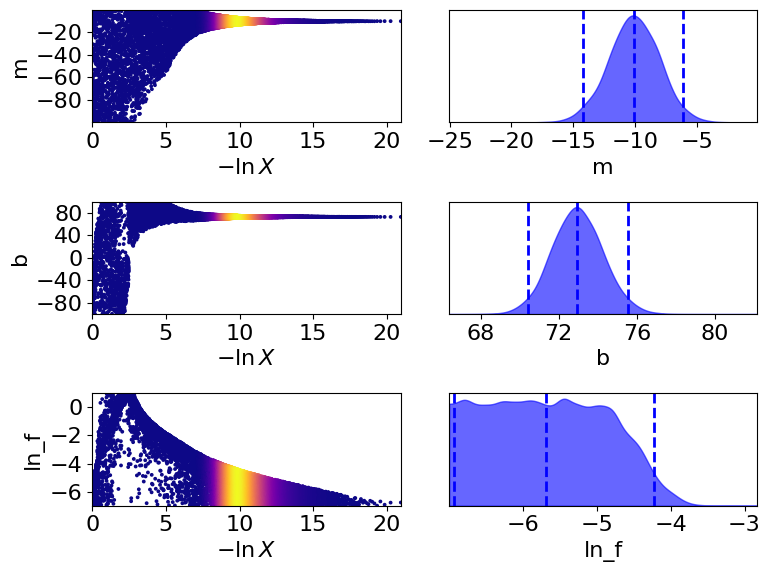

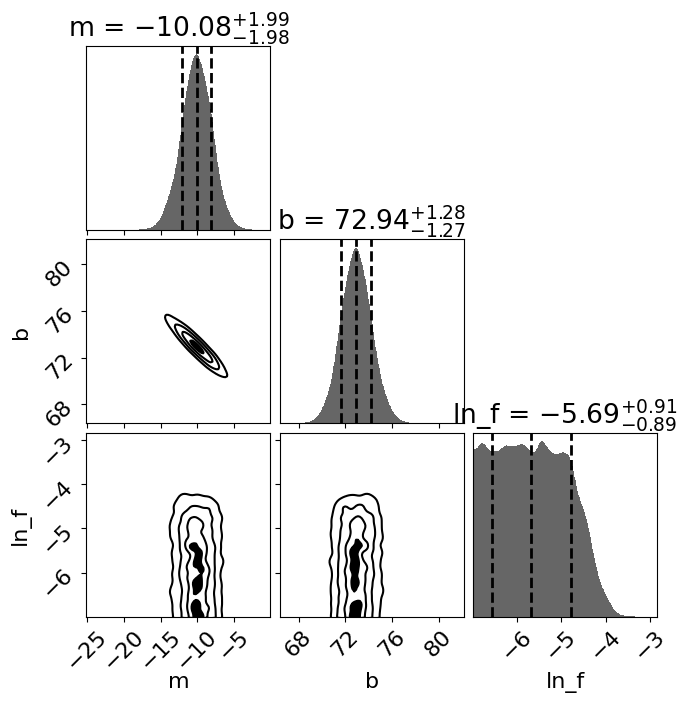

In [35]:
hecate._plot_local_params(indices_final, local_params, master_params, linear_fit=True, plot_nested=True, save=None)